# Машинное обучение, ФКН ВШЭ

## Практическое задание 2. Exploratory Data Analysis и линейная регрессия

### Общая информация
Дата выдачи: 05.10.2023

Мягкий дедлайн: 23:59MSK 18.10.2023

Жесткий дедлайн: 23:59MSK 22.10.2022

### О задании
В этом задании мы попытаемся научиться анализировать данные и выделять из них полезные признаки. Мы также научимся пользоваться `seaborn` и `sklearn`, а заодно привыкнем к основным понятиям машинного обучения.

### Оценивание и штрафы
Каждая из задач имеет определенную «стоимость» (указана в скобках около задачи). Максимально допустимая оценка за работу — 10 баллов. Проверяющий имеет право снизить оценку за неэффективную реализацию или неопрятные графики.

**Обратите внимание**, что в каждом разделе домашнего задания есть оцениваниемые задачи и есть вопросы. Вопросы дополняют задачи и направлены на то, чтобы проинтерпретировать или обосновать происходящее. Код без интерпретации не имеет смысла, поэтому отвечать на вопросы обязательно — за отсутствие ответов мы будем снижать баллы за задачи. Если вы ответите на вопросы, но не напишете корректный код к соответствующим оцениваемым задачам, то баллы за такое выставлены не будут.

Сдавать задание после указанного срока сдачи нельзя. При выставлении неполного балла за задание в связи с наличием ошибок на усмотрение проверяющего предусмотрена возможность исправить работу на указанных в ответном письме условиях.

Задание выполняется самостоятельно. «Похожие» решения считаются плагиатом и все задействованные студенты (в том числе те, у кого списали) не могут получить за него больше 0 баллов (подробнее о плагиате см. на странице курса). Если вы нашли решение какого-то из заданий (или его часть) в открытом источнике, необходимо указать ссылку на этот источник в отдельном блоке в конце вашей работы (скорее всего вы будете не единственным, кто это нашел, поэтому чтобы исключить подозрение в плагиате, необходима ссылка на источник).

### Формат сдачи
Задания сдаются через систему Anytask. Инвайт можно найти на странице курса. Присылать необходимо ноутбук с выполненным заданием. Сам ноутбук называйте в формате homework-practice-02-linregr-Username.ipynb, где Username — ваша фамилия.

Для удобства проверки самостоятельно посчитайте свою максимальную оценку (исходя из набора решенных задач) и укажите ниже.

Оценка: xx.

В этом ноутбуке используется библиотека `folium` для визуализации карт. Она работает в google colab!

In [2]:
!pip3 install folium

In [3]:
import folium

m = folium.Map(location=(55.7522200, 37.6155600), zoom_start=10)

m

Если вы всё сделали правильно, то выше должна открыться карта Москвы.

In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime as dt, timedelta
from IPython.display import display

pd.set_option('display.max_columns', None)

%matplotlib inline
# %config InlineBackend.figure_format = 'retina'

# sns.set(style='whitegrid', palette='deep')
# sns.set(style='darkgrid', palette=sns.color_palette("husl", 20))
# sns.set(style='darkgrid', palette='deep')
sns.set(style='darkgrid', palette='rocket')

plt.rcParams['figure.figsize'] = 8, 5
plt.rcParams['font.size'] = 12
plt.rcParams['savefig.format'] = 'pdf'

np.random.seed(0)

## Часть 0. Подготовка (1 балл)

**Задание 1 (1 балл)**. Мы будем работать с данными из соревнования [New York City Taxi Trip Duration](https://www.kaggle.com/c/nyc-taxi-trip-duration/overview), в котором нужно было предсказать длительность поездки на такси. Скачайте обучающую выборку из этого соревнования и загрузите ее:

In [5]:
# !wget  -O 'taxi.csv' -q 'https://www.dropbox.com/s/en5f9nhn915cnkf/_train.csv?dl=0'

In [6]:
df = pd.read_csv('taxi.csv')
df.head()

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration
0,id2875421,2,2016-03-14 17:24:55,2016-03-14 17:32:30,1,-73.982155,40.767937,-73.964630,40.765602,N,455
1,id2377394,1,2016-06-12 00:43:35,2016-06-12 00:54:38,1,-73.980415,40.738564,-73.999481,40.731152,N,663
2,id3858529,2,2016-01-19 11:35:24,2016-01-19 12:10:48,1,-73.979027,40.763939,-74.005333,40.710087,N,2124
3,id3504673,2,2016-04-06 19:32:31,2016-04-06 19:39:40,1,-74.010040,40.719971,-74.012268,40.706718,N,429
4,id2181028,2,2016-03-26 13:30:55,2016-03-26 13:38:10,1,-73.973053,40.793209,-73.972923,40.782520,N,435


Обратите внимание на колонки `pickup_datetime` и `dropoff_datetime`. `dropoff_datetime` был добавлена организаторами только в обучающую выборку, то есть использовать эту колонку нельзя, давайте удалим ее. В `pickup_datetime` записаны дата и время начала поездки. Чтобы с ней было удобно работать, давайте преобразуем даты в `datetime`-объекты

In [7]:
df = df.drop(columns=['dropoff_datetime'])
df['pickup_datetime'] = pd.to_datetime(df['pickup_datetime'], yearfirst=True)

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1458644 entries, 0 to 1458643
Data columns (total 10 columns):
 #   Column              Non-Null Count    Dtype         
---  ------              --------------    -----         
 0   id                  1458644 non-null  object        
 1   vendor_id           1458644 non-null  int64         
 2   pickup_datetime     1458644 non-null  datetime64[ns]
 3   passenger_count     1458644 non-null  int64         
 4   pickup_longitude    1458644 non-null  float64       
 5   pickup_latitude     1458644 non-null  float64       
 6   dropoff_longitude   1458644 non-null  float64       
 7   dropoff_latitude    1458644 non-null  float64       
 8   store_and_fwd_flag  1458644 non-null  object        
 9   trip_duration       1458644 non-null  int64         
dtypes: datetime64[ns](1), float64(4), int64(3), object(2)
memory usage: 111.3+ MB


В колонке `trip_duration` записано целевое значение, которое мы хотим предсказывать. Давайте посмотрим на распределение таргета в обучающей выборке. Для этого нарисуйте его гистограмму:

Удобнее будет смотреть на время поездки в минутах

In [8]:
df['trip_duration_m'] = df['trip_duration'].astype(np.float64) / 60

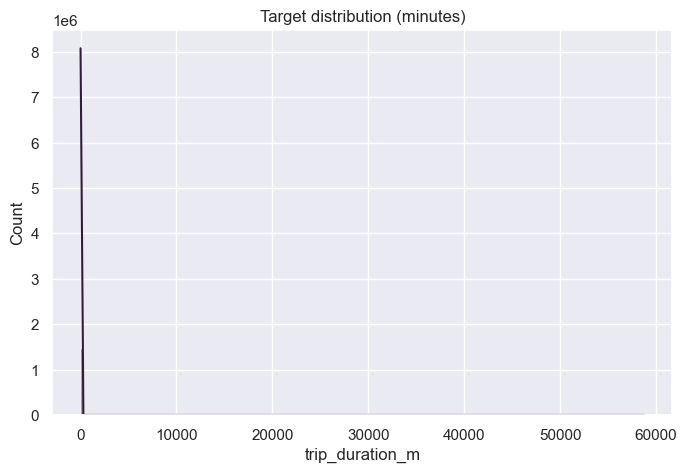

In [9]:
sns.histplot(data=df, x="trip_duration_m", bins=200, kde=True)
plt.title("Target distribution (minutes)")
plt.show()

У нас есть какие-то очень тяжелые хвосты - поездки свыше 24 часов - точно выбросы. Как проверили какие-то блогеры, в Яндексе такое даже технически невозможно

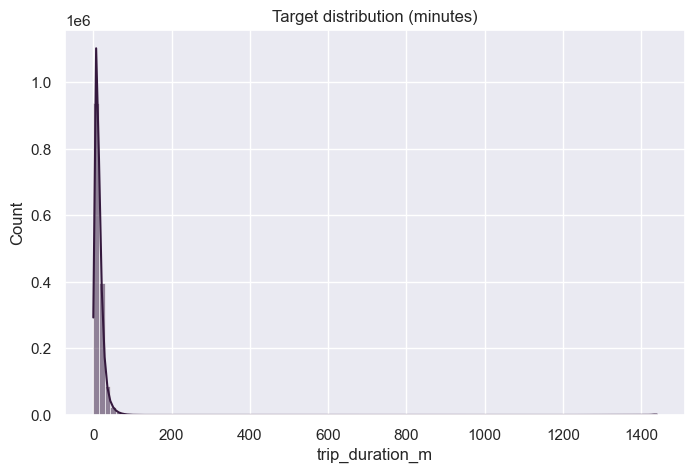

In [10]:
sns.histplot(data=df[df.trip_duration_m <= 60 * 24], x="trip_duration_m", bins=100, kde=True)
plt.title("Target distribution (minutes)")
plt.show()

Тяжелый хвост есть и тут - посмотрим на самый реальный кейс поездок - до 2 часов

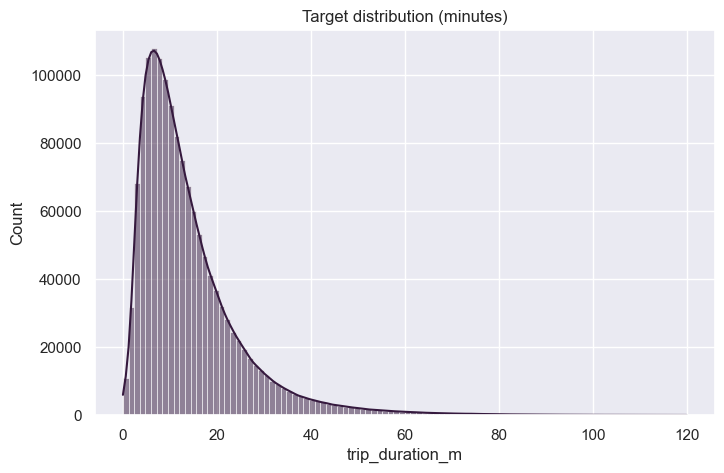

In [11]:
sns.histplot(data=df[df.trip_duration_m <= 120], x="trip_duration_m", bins=100, kde=True)
plt.title("Target distribution (minutes)")
plt.show()

In [12]:
len(df[df.trip_duration_m > 120]) / df.shape[0]

0.0015445852449261094

In [13]:
df = df.drop(columns=["trip_duration_m"])

**Вопрос**: Что можно сказать о целевой переменной по гистограмме её значений?

1. У нас есть серьезные выбросы - скорее технические (не завершили поездку и тд)\
2. Поездок свыше 2 часов - сильно меньше 1%, а это значит, что, данные в целом довольно чистые и можно, к примеру, грубо обрезать по 2 часам\
3. Продолжительность поездок похожа на лог-нормальное распределение с тяжелым хвостом - это хорошо для обучения

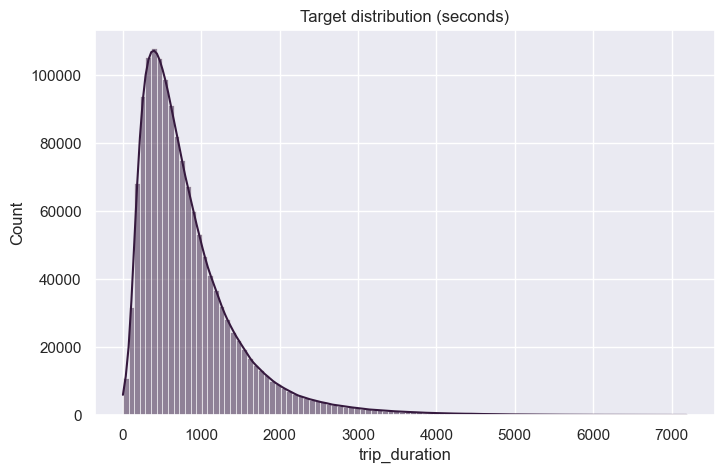

In [14]:
sns.histplot(data=df[df.trip_duration <= 120 * 60], x="trip_duration", bins=100, kde=True)
plt.title("Target distribution (seconds)")
plt.show()

В соревновании в качестве метрики качества использовалось RMSLE:
$$\text{RMSLE}(X, y, a) = \sqrt{\frac{1}{\ell}\sum_{i=1}^{\ell} \big(\log{(y_i + 1)} - \log{(a(x_i) + 1)}\big)^2}$$

**Вопрос**: Как вы думаете, почему авторы соревнования выбрали именно RMSLE, а не RMSE?

Для ответа я все же построил распределение исходного таргета в секундах\
1. Данная метрика за счет логарифма сравнивает не значения ответа и предсказания, а их масштабы. Так, оишибки в парах (120, 240) и (1200, 2400) - не сильно разнятся, а вот за (120, 1200) - мы уже будем очень сильно штрафовать.\
Если посмотреть на это в минутах, то для задачи (2, 4) и (20, 40) - это два почти одинаково хороших предсказания, а вот за (2, 20) - она уже получит по шапке.\
Это, скорее всего, продиктовано продуктовой задачей - нам главное уметь предсказывать "порядок" продолжительности поездки - она будет короткая, средняя или длинная

2. С точк зрения техники, эта метрика менее чувствительна к выбросам - модели невыгодно завышать предсказания, чтобы подогнаться по порядку под выброс.

P.S.: Очевидно, что в примерах, неважно, что в паре предсказание, а что - реальный ответ

На семинаре мы рассматривали несколько моделей линейной регрессии в `sklearn`, но каждая из них оптимизировала среднеквадратичную ошибку (MSE), а не RMSLE. Давайте проделаем следующий трюк: будем предсказывать не целевую переменную, а ее *логарифм*. Обозначим $\hat{y}_i = \log{(y_i + 1)}$ — модифицированный таргет, а $\hat{a}(x_i)$ — предсказание модели, которая обучалась на $\hat{y}_i$, то есть логарифм таргета. Чтобы предсказать исходное значение, мы можем просто взять экспоненту от нашего предсказания: $a(x_i) = \exp(\hat{a}(x_i)) - 1$.

**Вопрос**: Покажите, что оптимизация RMSLE для модели $a$ эквивалентна оптимизации MSE для модели $\hat{a}$.

**Доказательство**:

Хотим показать: $a(x) = argmin_a(\text{RMSLE}(X, y, a)) \Leftrightarrow \hat{a}(x) = argmin_{\hat{a}}(\text{MSE}(X, \hat{y}, \hat{a}))$

Если я правильно понял, то мы рассматриваем минимизацию RMSLE  не по множеству линейных моделей $\hat{\mathbb{A}} = \mathbb{R}^d$, а по множеству $\mathbb{A} = \{e^{a(x)} - 1 | a \in \hat{\mathbb{A}}\}$. 

Авторская интуиция: Если $\hat{a}(x)$ приближает $log$ таргета, т.е. его порядок, то $a(x) = e^{\hat{a}(x)} - 1$ будет хорошо приближать сам таргет, но не по значению, а в "норме порядка", если выражаться совсем неформально

Покажем просто эквивалентность функционалов ошибки:

$\text{RMSLE}(X, y, a) = \sqrt{\frac{1}{\ell}\sum_{i=1}^{\ell} \big(\log{(y_i + 1)} - \log{(a(x_i) + 1)}\big)^2} = \sqrt{\frac{1}{\ell}\sum_{i=1}^{\ell} \big(\hat{y}_i - \log{(a(x_i) + 1)}\big)^2} = \sqrt{\frac{1}{\ell}\sum_{i=1}^{\ell} \big(\hat{y}_i - \hat{a}(x_i)\big)^2} = \text{RMSE}(X, \hat{y}, \hat{a})$

С учетом того, что оптимизация RMSE и MSE эквивалентны в силу выпуклости корня, то мы показали, что хотели: если минизируем правую или левую часть по нужному множеству моделей, то заданным преобразованием $a(x_i) = e^{\hat{a}(x_i)} - 1$ можем получить оптимум другой части

Итак, мы смогли свести задачу оптимизации RMSLE к задаче оптимизации MSE, которую мы умеем решать! Кроме того, у логарифмирования таргета есть еще одно полезное свойство. Чтобы его увидеть, добавьте к нашей выборке колонку `log_trip_duration` (воспользуйтесь `np.log1p`) и нарисуйте гистограмму модифицированного таргета по обучающей выборке. Удалите колонку со старым таргетом.

In [15]:
df["log_trip_duration"] = np.log1p(df["trip_duration"])
df = df.drop(columns=["trip_duration"])

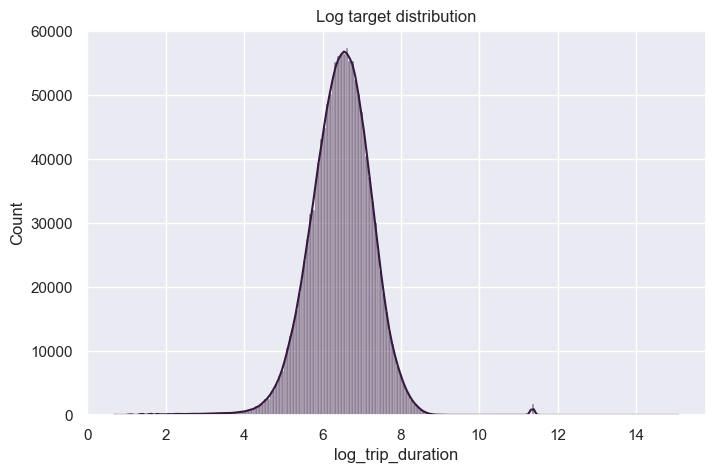

In [16]:
sns.histplot(data=df, x="log_trip_duration", bins=200, kde=True)
plt.title("Log target distribution")
plt.show()

Нормальное распределение с выбросами справа и очень тяжелым концом слева - как неожиданно и приятноооооо

Чтобы иметь некоторую точку отсчета, давайте посчитаем значение метрики при наилучшем константном предсказании:

In [17]:
def rmsle(log1p_y_true, log1p_y_pred): 
    return np.sqrt(np.mean((log1p_y_true - log1p_y_pred) ** 2))

rmsle_best_const = rmsle(df.log_trip_duration, np.repeat(np.mean(df.log_trip_duration), df.shape[0])) 
print(rmsle_best_const)
assert np.allclose(rmsle_best_const, 0.79575, 1e-4)

0.7957592365411509


## Часть 1. Изучаем `pickup_datetime` (2 балла)

**Задание 2 (0.25 баллов)**. Для начала давайте посмотрим, сколько всего было поездок в каждый из дней. Постройте график зависимости количества поездок от дня в году (например, можно воспользоваться `sns.countplot`):

In [18]:
df["date"] = df["pickup_datetime"].dt.strftime('%Y-%m-%d')

start_date = dt.strptime(np.min(df["date"]), '%Y-%m-%d')
end_date = dt.strptime(np.max(df["date"]), '%Y-%m-%d')
labels_dates = [dt.strftime(start_date + timedelta(days=x), '%Y-%m-%d') for x in range((end_date - start_date).days + 1)]

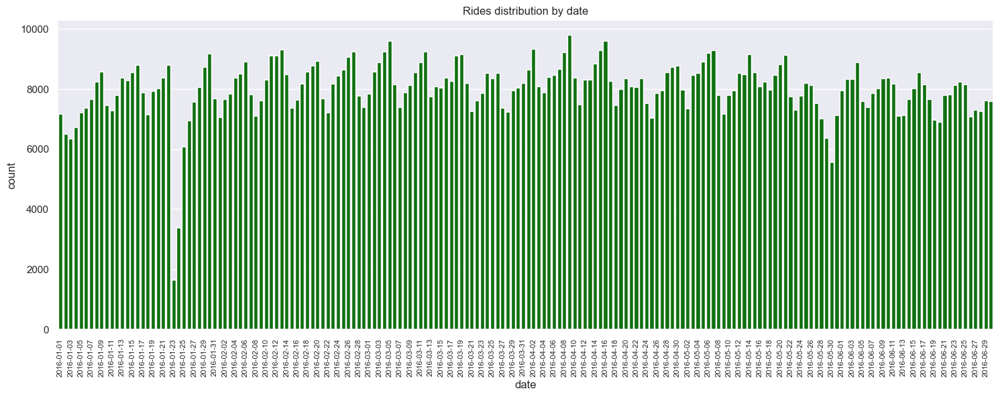

In [19]:
fig, ax = plt.subplots(figsize=(18, 6))
sns.countplot(df.sort_values(by=["date"]), x="date", ax=ax, color="g")
ax.set_title("Rides distribution by date")
ax.set_xticks(ticks=np.arange(len(labels_dates))[::2], labels=labels_dates[::2], rotation=90, fontsize=8)
plt.show()

In [20]:
df["date"].value_counts()[-10:-1:1]

date
2016-01-26    6941
2016-06-20    6910
2016-01-04    6725
2016-01-02    6512
2016-05-29    6372
2016-01-03    6353
2016-01-25    6084
2016-05-30    5570
2016-01-24    3383
Name: count, dtype: int64

**Вопрос**: Вы, вероятно, заметили, что на графике есть 2 периода с аномально маленькими количествами поездок. Вычислите, в какие даты происходили эти скачки вниз и найдите информацию о том, что происходило в эти дни в Нью-Йорке.

Видно, что выбросы с 2016-01-23 по 2016-01-25 и с 2016-05-28 по 2016-05-30

Первое было вызвано [аномальным снегопадом](https://www.usatoday.com/story/weather/2016/01/23/blizzard-continues-slam-east-coast/79217258/)\
Второе - День поминовения, который выпал на понедельник, отчего 28-30 были выходным и все уехали чиллить еще в пятницу-субботу + на эти дни выпала [аномальная жара](https://weatherspark.com/h/m/23912/2016/5/Historical-Weather-in-May-2016-in-New-York-City-New-York-United-States#Figures-ColorTemperature) - как тут не улететь в Майами кататься на серфе?

Нарисуйте графики зависимости количества поездок от дня недели и от часов в сутках (воспользуйтесь `sns.relplot`):

In [21]:
df["week_day"] = df["pickup_datetime"].dt.weekday
df['month'] = df["pickup_datetime"].dt.month_name()
df["hour"] = df["pickup_datetime"].dt.strftime("%H").astype(np.int32)

week_days = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]

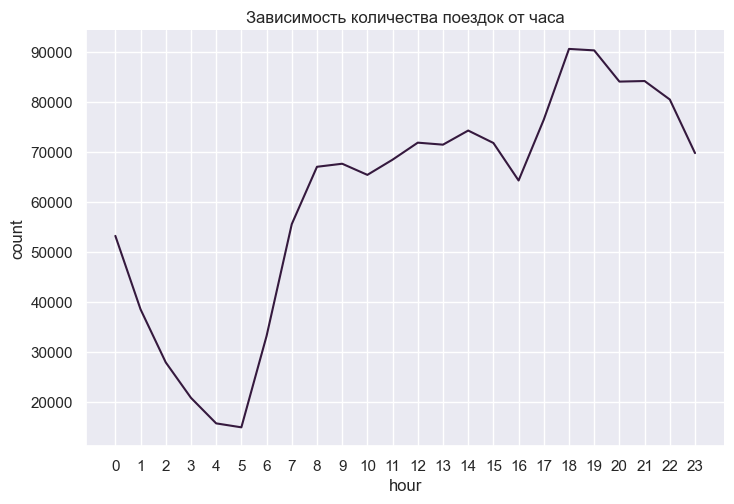

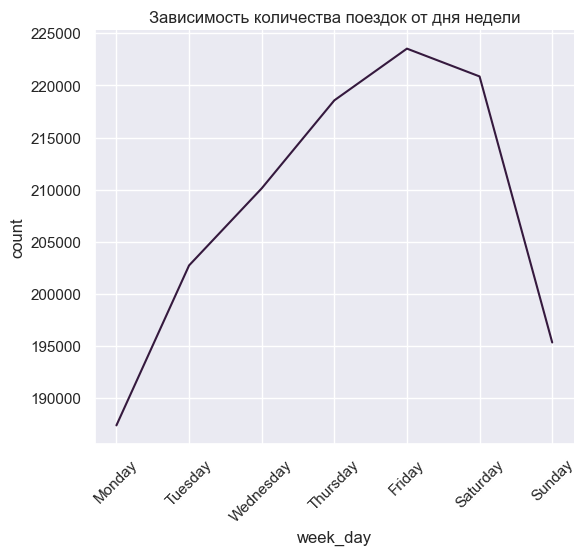

In [22]:
sns.relplot(
    data=df.groupby(["hour"]).count().rename(columns={"id" : "count"}),
    x="hour",
    y="count",
    kind="line",
    aspect=1.5
).set(
    title="Зависимость количества поездок от часа"
)
plt.xticks(np.arange(24))
plt.show()

sns.relplot(
    data=df.groupby(["week_day"]).count().rename(columns={"id" : "count"}),
    x="week_day",
    y="count",
    kind="line",
    aspect=1.2
).set(
    title="Зависимость количества поездок от дня недели"
)
plt.xticks(np.arange(7), week_days, rotation=45)
plt.show()

Все настолько хорошо, что в данных даже не поехал часовой пояс!!!

**Задание 3 (0.5 баллов)**. Нарисуйте на одном графике зависимости количества поездок от часа в сутках для разных месяцев (разные кривые, соответствующие разным месяцам, окрашивайте в разные цвета, воспользуйтесь `hue` в `sns.relplot`). Аналогично нарисуйте зависимости количества поездок от часа в сутках для разных дней недели.

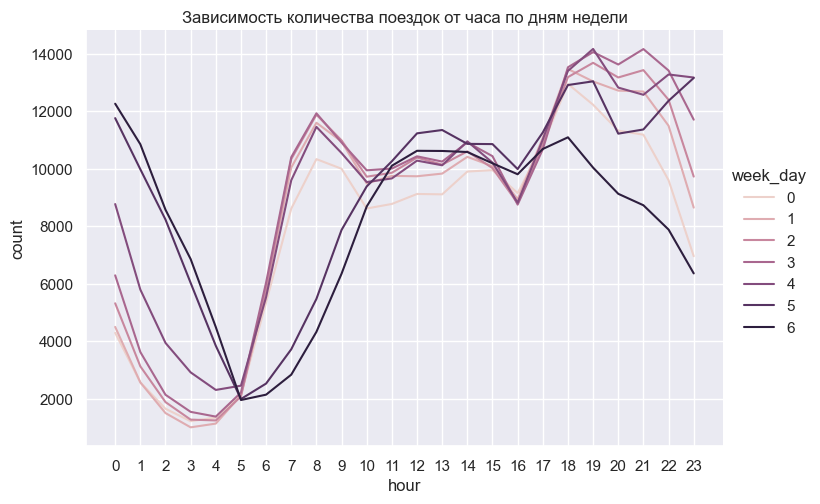

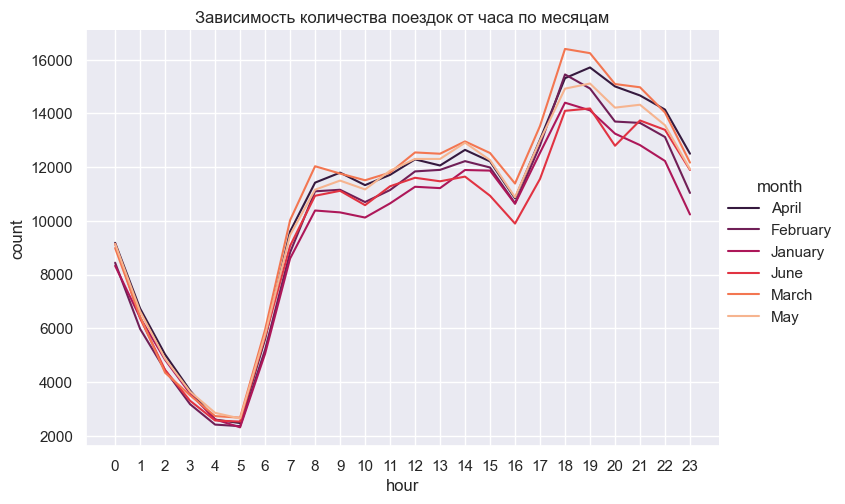

In [23]:
sns.relplot(
    data=df.groupby(["week_day", "hour"]).count().rename(columns={"id" : "count"}),
    x="hour",
    y="count",
    kind="line",
    hue="week_day",
    aspect=1.5
).set(
    title="Зависимость количества поездок от часа по дням недели"
)
plt.xticks(np.arange(24))
plt.show()

sns.relplot(
    data=df.groupby(["month", "hour"]).count().rename(columns={"id" : "count"}),
    x="hour",
    y="count",
    kind="line",
    hue="month",
    aspect=1.5
).set(
    title="Зависимость количества поездок от часа по месяцам"
)
plt.xticks(np.arange(24))
plt.show()

**Вопрос**: Какие выводы можно сделать, основываясь на графиках выше? Выделяются ли какие-нибудь дни недели? Месяца? Время суток? С чем это связано?

1. Максимум поездок по дням недели в пятницу - люди уезжают на выходные/в бары/etc. Отсюда же просадка в воскресенье
2. Просадка в 16:00 - скорее всего обеденное время + наблюдается больше в рабочие дни. Пик в 18:00 - конец рабочего дня
3. В субботу и воскресенье - больше поездок после с 00:00 до 05:00 - люди едут домой из баров на комфорт+
4. В рабочик дни скачок в 6 утра - отъезд на работу
5. В воскресенье меньше всего поездок с 18:00 до 23:00 - люди готовятся к рабочей неделе уже дома
6. Июнь и январь местами ниже остальных - сезонность, которая в июне проявляется сильнее - в городе меньше людей
7. В январе просадка можеть быть еще немного связана с аномалией (потеряли около 10к поездок)

**Задание 4 (0.5 баллов)**. Разбейте выборку на обучающую и тестовую в отношении 7:3 (используйте `train_test_split` из `sklearn`). По обучающей выборке нарисуйте график зависимости среднего логарифма времени поездки от дня недели. Затем сделайте то же самое, но для часа в сутках и дня в году.

In [24]:
from sklearn.model_selection import train_test_split

df = df.drop(columns=["id"])

y = df["log_trip_duration"]
X = df.drop(columns=["log_trip_duration"])

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

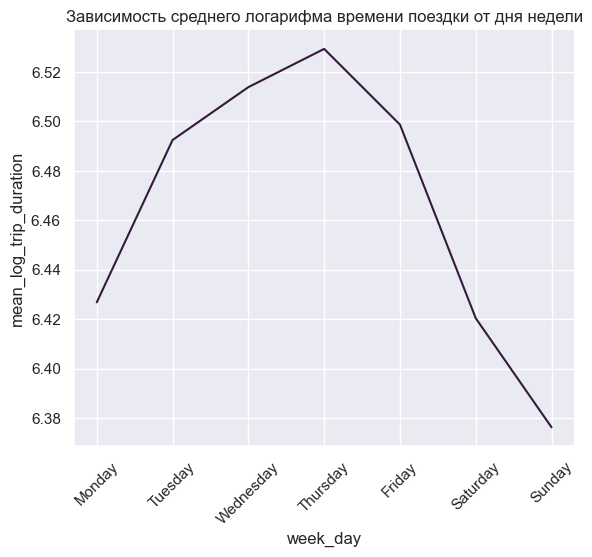

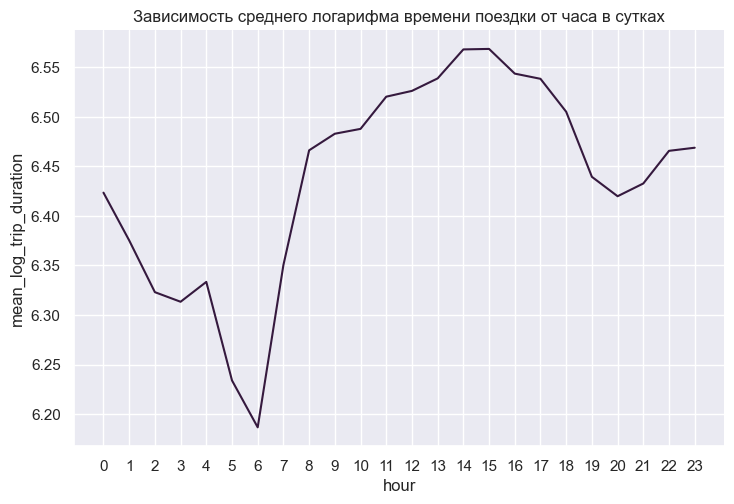

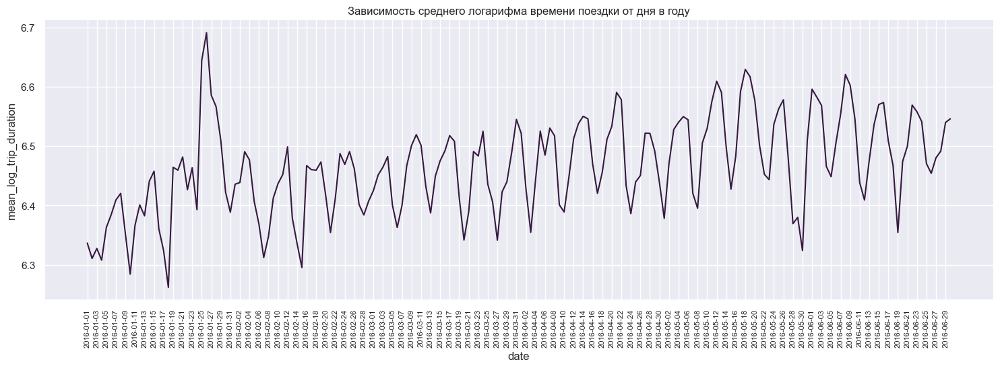

In [25]:
df_train = X_train.copy()
df_train["log_trip_duration"] = y_train

sns.relplot(
    data=df_train.groupby(["week_day"]).agg({"log_trip_duration" : "mean"}).rename(columns={"log_trip_duration" : "mean_log_trip_duration"}),
    x="week_day",
    y="mean_log_trip_duration",
    kind="line",
    aspect=1.2
).set(
    title="Зависимость среднего логарифма времени поездки от дня недели"
)
plt.xticks(np.arange(7), week_days, rotation=45)
plt.show()

sns.relplot(
    data=df_train.groupby(["hour"]).agg({"log_trip_duration" : "mean"}).rename(columns={"log_trip_duration" : "mean_log_trip_duration"}),
    x="hour",
    y="mean_log_trip_duration",
    kind="line",
    aspect=1.5
).set(
    title="Зависимость среднего логарифма времени поездки от часа в сутках"
)
plt.xticks(np.arange(24))
plt.show()

sns.relplot(
    data=df_train.groupby(["date"]).agg({"log_trip_duration" : "mean"}).rename(columns={"log_trip_duration" : "mean_log_trip_duration"}).sort_values(by="date"),
    x="date",
    y="mean_log_trip_duration",
    kind="line",
    aspect=3
).set(
    title="Зависимость среднего логарифма времени поездки от дня в году"
)
plt.xticks(ticks=np.arange(len(labels_dates))[::2], labels=labels_dates[::2], rotation=90, fontsize=8)
plt.show()

**Вопрос**: Похожи ли графики зависимости таргета от дня недели и от часа в сутках на аналогичные графики для количества поездок? Почему? Что происходит со средним таргетом в те два аномальных периода, что мы видели выше? Почему так происходит? Наблюдаете ли вы какой-нибудь тренд на графике зависимости `log_trip_duration` от номера дня в году?

> Похожи ли графики зависимости таргета от дня недели и от часа в сутках на аналогичные графики для количества поездок? Почему?
> 
Да, похожи по тренду в течение недели/дня, но локально могут иметь иной тренд. Это точно связано с траффиком - наши объяснения количества поездок также справедливы и для всего трафик, отчего возникают пробки и увеличение времени. Понятно, что а) это не единственная причина и б) использование такси не всегда коррелирует с использованием личного транспорта (к примеру, подумайте про вечер-ночь пятницы), поэтому и появляются локальные несхожие тренды

> Что происходит со средним таргетом в те два аномальных периода, что мы видели выше? Почему так происходит?
>
В январе с 25го по 29е сильный скачок по времени - скорее всего, это связано с дорожными работами/уборкой снега/авариями на фоне гололедицы\
В мае с 28го по 30е, когда было 3 выходных, наоборот траффик в Нью-Йорке был снижен, отчего среднее время поездки значительно сократилось

> Наблюдаете ли вы какой-нибудь тренд на графике зависимости `log_trip_duration` от номера дня в году?
>
Виден тренд в рамках каждой недели. По датам виден планомерный рост - это можно заметить, к примеру, по тому, что с мая даже на воскресной просадке среднее время (лог) не опускается ниже 6.4, в отличие от периода с январе по апрель

Добавьте следующие признаки на основе `pickup_datetime`:
1. День недели
2. Месяц
3. Час
4. Является ли период аномальным (два бинарных признака, соответствующие двум аномальным периодам)
5. Номер дня в году

In [26]:
X_train.head(5)

,vendor_id,pickup_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,date,week_day,month,hour
1011257,2,2016-05-03 09:03:08,2,-73.979813,40.752529,-73.982681,40.763680,N,2016-05-03,1,May,9
178550,1,2016-01-01 16:40:51,1,-73.977623,40.746296,-73.968414,40.788933,N,2016-01-01,4,January,16
551460,1,2016-04-24 13:57:03,1,-73.950699,40.779404,-73.863129,40.768608,N,2016-04-24,6,April,13
1434271,2,2016-01-10 17:03:47,1,-73.984558,40.721802,-73.976753,40.752213,N,2016-01-10,6,January,17
1173610,1,2016-02-25 17:37:36,1,-73.967720,40.768742,-73.977173,40.789875,N,2016-02-25,3,February,17


In [27]:
def add_time_features(X):
    X['month'] = X['pickup_datetime'].dt.month
    X['is_anomaly_jan'] =  df.date.between("2016-01-25", "2016-01-29").astype(np.int32)
    X['is_anomaly_may'] =  df.date.between("2016-05-28", "2016-05-30").astype(np.int32)
    X['day_of_year'] = X['pickup_datetime'].dt.dayofyear

add_time_features(X_train)
add_time_features(X_test)
add_time_features(df)

In [28]:
X_train.head()

,vendor_id,pickup_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,date,week_day,month,hour,is_anomaly_jan,is_anomaly_may,day_of_year
1011257,2,2016-05-03 09:03:08,2,-73.979813,40.752529,-73.982681,40.763680,N,2016-05-03,1,5,9,0,0,124
178550,1,2016-01-01 16:40:51,1,-73.977623,40.746296,-73.968414,40.788933,N,2016-01-01,4,1,16,0,0,1
551460,1,2016-04-24 13:57:03,1,-73.950699,40.779404,-73.863129,40.768608,N,2016-04-24,6,4,13,0,0,115
1434271,2,2016-01-10 17:03:47,1,-73.984558,40.721802,-73.976753,40.752213,N,2016-01-10,6,1,17,0,0,10
1173610,1,2016-02-25 17:37:36,1,-73.967720,40.768742,-73.977173,40.789875,N,2016-02-25,3,2,17,0,0,56


Важно, что январскую аномалию мы здесь отмечаем по аномалии времени поездки, а не количеству поездок

Итак, мы уже создали некоторое количество признаков.

**Вопрос**: Какие из признаков _стоит рассматривать в этой задаче_   как категориальные, а какие - как численные? Почему?

Из тех, что мы выделили в этой части - все признаки, кроме аномалий, категориальные: день недели, месяц, час, номер дня в году. Они хоть и представлены численно, но никакой осмысленной арифметики они за собой не несут. К тому же, как мы видели, зависимость от часа и дня - далеко нелинейна.

Единственное, что из этого всего можно попробовать считать как числовой признак - это номер дня в году, так как линейный рост прослеживается, а все флактуации будут учтены в признаке дня недели/часа. Это еще сэкономит нам памяти, но все же идея немного сомнительная - проверим.

Аномалии- бинарный признак

Из остальных:\
passenger_count - числовой;\
vendor_id - категориальный;\
store_and_fwd_flag - бинарный

Координаты мы потом будем бинаризовать - пока можно считать их категориальными в смысле локации, но делать так не нужно - ресурсов колаба на дл не хватит

**Задание 5 (0.75 баллов)**. Обучите `Ridge`-регрессию с параметрами по умолчанию, закодировав все категориальные признаки с помощью `OneHotEncoder`. Численные признаки отмасштабируйте с помощью `StandardScaler`. Используйте только признаки, которые мы выделили в этой части задания.

In [29]:
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.linear_model import Ridge, Lasso

# Код ~ как из семинара про линрег
def fit_predict_cat_num(X_train, y_train, X_test, y_test, categorical_f=[], numeric_f=[], other_f=[]):
    column_transformer = ColumnTransformer([
        ('ohe', OneHotEncoder(handle_unknown="ignore"), categorical_f),
        ('scaling', StandardScaler(), numeric_f),
        ('pass_other', "passthrough", other_f)
    ])
    
    pipeline = Pipeline(steps=[
        ('ohe_and_scaling', column_transformer),
        ('regression', Ridge())
    ])

    model = pipeline.fit(X_train, y_train)
    y_train_pred = model.predict(X_train)
    y_pred = model.predict(X_test)

    print("Train RMSLE = %.4f" % rmsle(y_train, y_train_pred))
    print("Test RMSLE = %.4f" % rmsle(y_test, y_pred))

    return model, y_pred

Только наши категориальные фичи

In [30]:
categorical_f = ["hour", "week_day", "day_of_year", "month"]
other_f = ["is_anomaly_jan", "is_anomaly_may"]

model, y_pred = fit_predict_cat_num(X_train, y_train, X_test, y_test, categorical_f=categorical_f, other_f=other_f)

Train RMSLE = 0.7880
Test RMSLE = 0.7871


То есть в среднем мы ошибаемся почти на 0.8 в порядке - многовато, но попробуем бейзлайн - среднее по трейну

In [31]:
dummy_pred = np.mean(y_train)
y_train_dummy_pred = dummy_pred * np.ones(X_train.shape[0])
y_dummy_pred = dummy_pred * np.ones(X_test.shape[0])

print("Train RMSLE = %.4f" % rmsle(y_train, y_train_dummy_pred))
print("Test RMSLE = %.4f" % rmsle(y_test, y_dummy_pred))

Train RMSLE = 0.7961
Test RMSLE = 0.7950


Забавы ради, оставим день в году числовым признаком

In [32]:
categorical_f = ["hour", "week_day", "month"]
numeric_f = ["day_of_year"]
other_f = ["is_anomaly_jan", "is_anomaly_may"]

model, y_pred = fit_predict_cat_num(X_train, y_train, X_test, y_test, categorical_f=categorical_f, numeric_f=numeric_f, other_f=other_f)

Train RMSLE = 0.7887
Test RMSLE = 0.7878


Почти не изменилось, а память сэкономили - КАТИМ В ПРОД!

## Часть 2. Изучаем координаты (3 балла)
Мы уже очень хорошо изучили данные о времени начала поездки, давайте теперь посмотрим на информацию о координатах начала и конца поездки. Мы подготовили для вас функцию, которая на карте рисует точки начала или конца поездки. Примеры ее вызова вы найдете ниже. Обратите внимание, что в эту функцию мы передаем лишь небольшой кусочек данных, посколько иначе функция будет работать очень долго

In [33]:
def show_circles_on_map(data, latitude_column, longitude_column, color):
    """
    The function draws map with circles on it.
    The center of the map is the mean of coordinates passed in data.
    
    data: DataFrame that contains columns latitude_column and longitude_column
    latitude_column: string, the name of column for latitude coordinates
    longitude_column: string, the name of column for longitude coordinates
    color: string, the color of circles to be drawn
    """

    location = (data[latitude_column].mean(), data[longitude_column].mean())
    m = folium.Map(location=location)

    for _, row in data.iterrows():
        folium.Circle(
            radius=100,
            location=(row[latitude_column], row[longitude_column]),
            color=color,
            fill_color=color,
            fill=True
        ).add_to(m)

    return m

In [34]:
show_circles_on_map(df.sample(1000), "pickup_latitude", "pickup_longitude", "blue")

In [35]:
show_circles_on_map(df.sample(1000), "dropoff_latitude", "dropoff_longitude", "blue")

**Вопрос**: Какие пункты (или скопления точек, в количестве 2-3), по вашему мнению, выделяются на карте от основной массы и могут быть полезны для нашей задачи? Почему вы их выбрали? В чём особенность этих скоплений точек для нашей задачи?

Есть очень удаленные точки - аэропорты (3 разных, но скопление только в 2х), а также сильные выброс, например, такси из New Brunswick или в Inwood. Это определенно дальние нетипичные поездки, отчего и порядок будет времени значительно выбиваться, как и фичи расстояния. 

Еще выделяются точки "на другом берегу" - их значительно меньше и они имееют больший разброс. Более того, этих точек больше при высадке - скорее всего это поездки из центра и они подольше перемещений по центру -> можно подумать об отдельной модели для них

**Задание 6 (0.75 балл)**. Как мы все прекрасно помним, $t = s / v_{\text{ср}}$, поэтому очевидно, что самым сильным признаком будет расстояние, которое необходимо проехать. Мы не можем посчитать точное расстояние, которое необходимо преодолеть такси, но мы можем его оценить, посчитав кратчайшее расстояние между точками начала и конца поездки. Чтобы корректно посчитать расстояние между двумя точками на Земле, можно использовать функцию `haversine`. Также можно воспользоваться кодом с первого семинара. Посчитайте кратчайшее расстояние для объектов и запишите его в колонку `haversine`:

In [36]:
X_train.head()

,vendor_id,pickup_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,date,week_day,month,hour,is_anomaly_jan,is_anomaly_may,day_of_year
1011257,2,2016-05-03 09:03:08,2,-73.979813,40.752529,-73.982681,40.763680,N,2016-05-03,1,5,9,0,0,124
178550,1,2016-01-01 16:40:51,1,-73.977623,40.746296,-73.968414,40.788933,N,2016-01-01,4,1,16,0,0,1
551460,1,2016-04-24 13:57:03,1,-73.950699,40.779404,-73.863129,40.768608,N,2016-04-24,6,4,13,0,0,115
1434271,2,2016-01-10 17:03:47,1,-73.984558,40.721802,-73.976753,40.752213,N,2016-01-10,6,1,17,0,0,10
1173610,1,2016-02-25 17:37:36,1,-73.967720,40.768742,-73.977173,40.789875,N,2016-02-25,3,2,17,0,0,56


In [37]:
def haversine_array(lat1, lng1, lat2, lng2):
    lat1, lng1, lat2, lng2 = map(np.radians, (lat1, lng1, lat2, lng2))
    AVG_EARTH_RADIUS = 6371  # in km
    lat = lat2 - lat1
    lng = lng2 - lng1
    d = np.sin(lat * 0.5) ** 2 + np.cos(lat1) * np.cos(lat2) * np.sin(lng * 0.5) ** 2
    h = 2 * AVG_EARTH_RADIUS * np.arcsin(np.sqrt(d))
    return h

Так как мы предсказываем логарифм времени поездки и хотим, чтобы наши признаки были линейно зависимы с этой целевой переменной, нам нужно логарифмировать расстояние: $\log t = \log s - \log{v_{\text{ср}}}$. Запишите логарифм `haversine` в отдельную колонку `log_haversine`:

In [38]:
def add_haversine_feature(X):
    X['haversine'] = haversine_array(X.pickup_latitude, X.pickup_longitude, X.dropoff_latitude, X.dropoff_longitude)
    X['log_haversine'] = np.log1p(X.haversine)

add_haversine_feature(X_train)
add_haversine_feature(X_test)
add_haversine_feature(df)

In [39]:
df.head()

,vendor_id,pickup_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,log_trip_duration,date,week_day,month,hour,is_anomaly_jan,is_anomaly_may,day_of_year,haversine,log_haversine
0,2,2016-03-14 17:24:55,1,-73.982155,40.767937,-73.964630,40.765602,N,6.122493,2016-03-14,0,3,17,0,0,74,1.498521,0.915699
1,1,2016-06-12 00:43:35,1,-73.980415,40.738564,-73.999481,40.731152,N,6.498282,2016-06-12,6,6,0,0,0,164,1.805507,1.031584
2,2,2016-01-19 11:35:24,1,-73.979027,40.763939,-74.005333,40.710087,N,7.661527,2016-01-19,1,1,11,0,0,19,6.385098,1.999464
3,2,2016-04-06 19:32:31,1,-74.010040,40.719971,-74.012268,40.706718,N,6.063785,2016-04-06,2,4,19,0,0,97,1.485498,0.910473
4,2,2016-03-26 13:30:55,1,-73.973053,40.793209,-73.972923,40.782520,N,6.077642,2016-03-26,5,3,13,0,0,86,1.188588,0.783257


Убедимся, что логарифм расстояния лучше коррелирует с нашим таргетом, чем просто расстояние:

In [40]:
your_df = df
assert your_df['log_haversine'].corr(your_df['log_trip_duration']) > your_df['haversine'].corr(your_df['log_trip_duration'])

**Задание 7 (0.75 балла)**. Давайте изучим среднюю скорость движения такси. Посчитайте среднюю скорость для каждого объекта обучающей выборки, разделив `haversine` на `trip_duration`, и нарисуйте гистограмму ее распределения

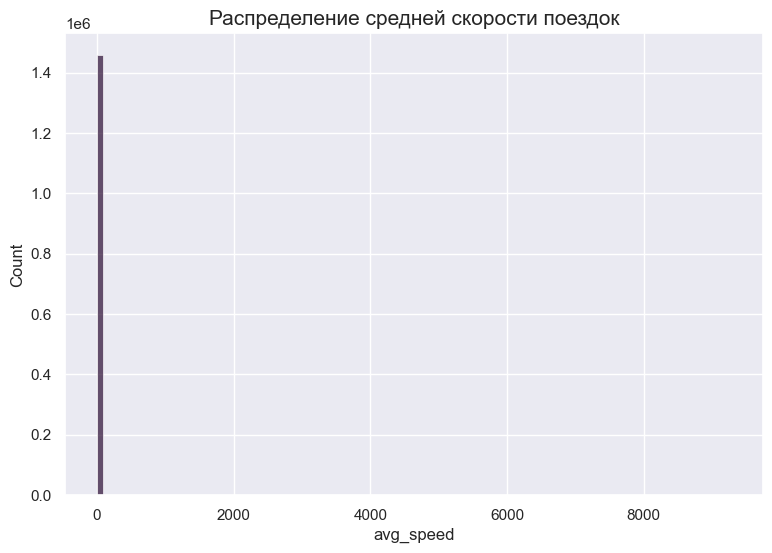

In [41]:
# вернем обратно
df["trip_duration"] = np.expm1(df["log_trip_duration"])
df["avg_speed"] = df["haversine"] / (df["trip_duration"] / 3600)

fig, ax = plt.subplots(figsize=(9, 6))
ax.set_title('Распределение средней скорости поездок', fontsize=15)
sns.histplot(df.avg_speed,
             bins=100,
             ax=ax)

plt.show()

Как можно видеть по гистограмме, для некоторых объектов у нас получились очень больше значения скоростей. Нарисуйте гистограмму по объектам, для которых значение скорости получилось разумным (например, можно не включать рассмотрение объекты, где скорость больше некоторой квантили):

Мы в самом начале видели, что есть выбросы свыше 24 часов - скорее всего, есть еще и выбросы по координатам. Проблемы с координатами - это супер частая проблема в базах, к сожалению. Найдем примеры

In [42]:
show_circles_on_map(df[df.dropoff_latitude < 40], "dropoff_latitude", "dropoff_longitude", "blue")

Ммм, счастливого путешествия в Казахстан!

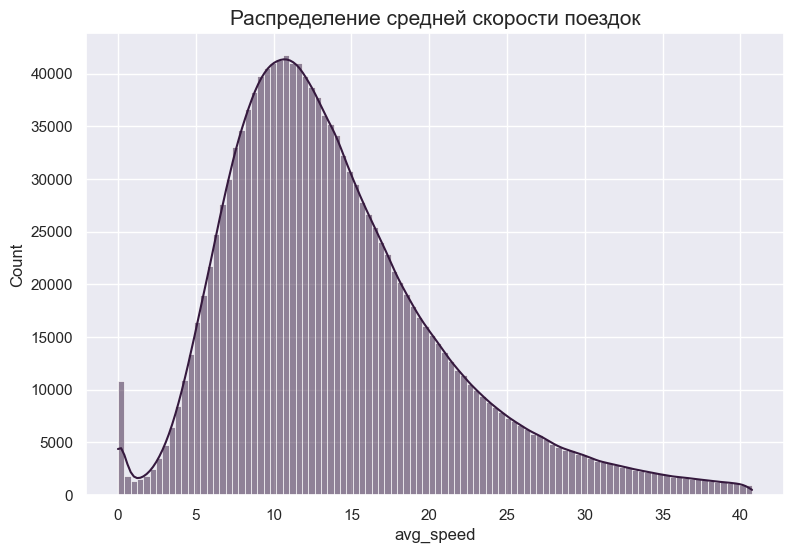

In [43]:
fig, ax = plt.subplots(figsize=(9, 6))
ax.set_title('Распределение средней скорости поездок', fontsize=15)
sns.histplot(df[df.avg_speed <= df.avg_speed.quantile(0.99)].avg_speed,
             bins=100,
             kde=True,
             ax=ax)

plt.show()

Лог-нормальное распределение с хвостом из-за выбросов по времени поездки (рассматривали в самом начале) и поездок без движения - уберем их тоже

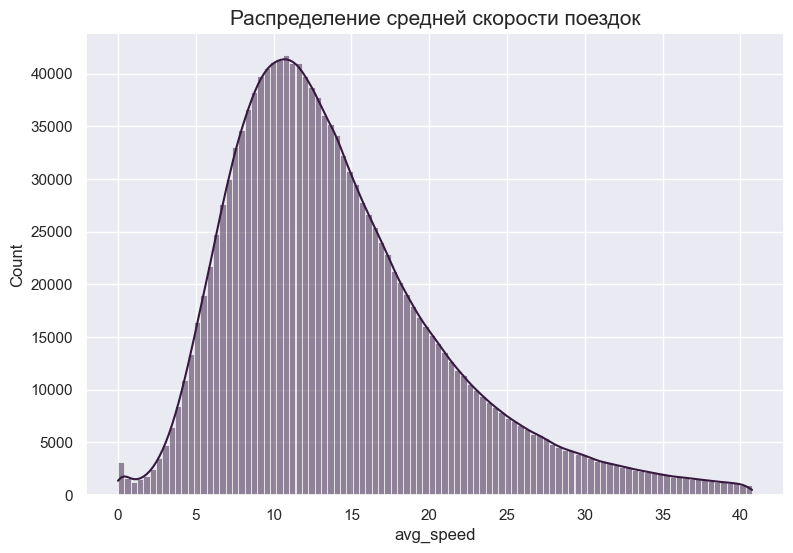

In [44]:
df_filtered_speed = df[(df.avg_speed <= df.avg_speed.quantile(0.99)) & (df.trip_duration <= 120 * 60) & (df.haversine > 0)]

fig, ax = plt.subplots(figsize=(9, 6))
ax.set_title('Распределение средней скорости поездок', fontsize=15)
sns.histplot(df_filtered_speed.avg_speed,
             bins=100,
             kde=True,
             ax=ax)

plt.show()

Для каждой пары (день недели, час суток) посчитайте медиану скоростей. Нарисуйте с помощью `sns.heatmap` график, где по осям будут дни недели и часы, а в качестве значения функции - медиана скорости

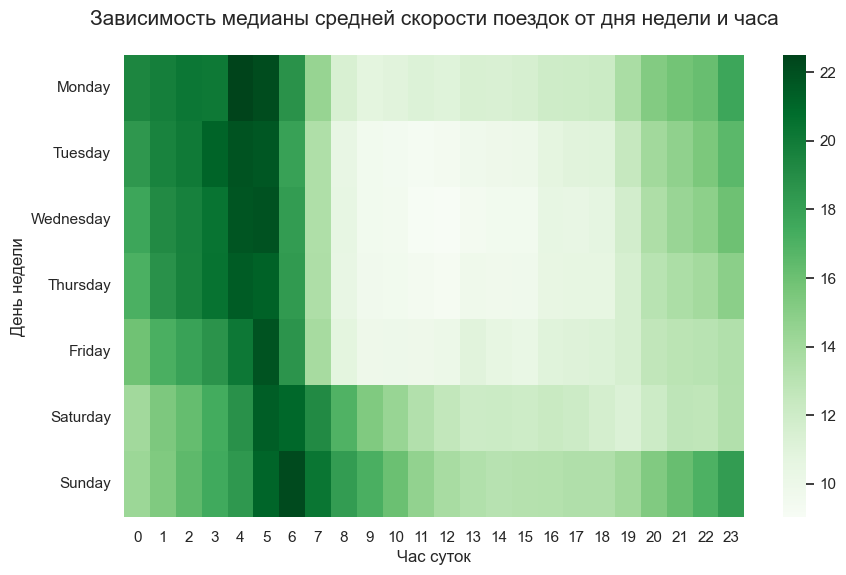

In [45]:
df_median_speed = df_filtered_speed.groupby(["week_day", "hour"]).agg({"avg_speed" : "median"}).rename(columns={"avg_speed" : "median_speed"}).reset_index()
df_pivot_speed = pd.pivot_table(data=df_median_speed,
                                index="week_day",
                                columns="hour",
                                values="median_speed")

fig, ax = plt.subplots(figsize=(10, 6))
ax = sns.heatmap(df_pivot_speed, 
                 ax=ax, 
                 yticklabels=week_days,
                 cmap="Greens")

ax.set_title('Зависимость медианы средней скорости поездок от дня недели и часа\n', fontsize=15)
ax.set_ylabel('День недели', fontsize=12)
ax.set_xlabel('Час суток', fontsize=12)

plt.show()

Не забудьте удалить колонку со значением скорости из данных!

**Вопрос**: Почему значение скорости нельзя использовать во время обучения?

Потому что это - data leak - скорость можно понять только на основе поездки, она не доступна в начале, т.е. мы заглядываем в будущее

In [46]:
df = df.drop(columns=["avg_speed"])

**Вопрос**: Посмотрите внимательно на график и скажите, в какие моменты времени скорость минимальна; максимальна.

Кажется странным, что медиана скорости в некоторые периоды < 10 км/ч. Но это объяснимо:

1. В нью-Йорке жестки ограничения - 25 миль/ч, то есть 40км/ч
2. Плотный траффик мегаполиса - если вернуться к графиками среднего времени поездки, то просадки скорости обратны пикам времени в пути (и по дням, и по часам) 

Скорость минимальна а рабочее время в будние дни - с 8 до 19
Скорость максимальна  ночью, когда траффик наиболее низкий, а также почти все воскресень 

Создайте признаки "поездка совершается в период пробок" и "поездка совершается в период свободных дорог" (естественно, они не должен зависеть от скорости!):

Период пробок - вт..пт с 8 до 18\
Период свободных дорог - пн..чт с 0 до 5, сб..вс с 5 до 7 и пт в 5

Я руководствовался мыслью, что чем более узкий критерий и более однородны эти группы, тем лучше на них обучиться модель

In [47]:
def get_period_mask(X, day_st, day_end, hour_st, hour_end):
    return (X.week_day.between(day_st, day_end)) & X.hour.between(hour_st, hour_end)


def add_traffic_features(X):
    X['high_traffic'] = get_period_mask(X, 1, 4, 8, 18).astype(np.int32)
    X['low_traffic'] = (get_period_mask(X, 0, 3, 0, 5) | get_period_mask(X, 5, 6, 5, 7) | get_period_mask(X, 4, 4, 5, 4)).astype(np.int32)

add_traffic_features(X_train)
add_traffic_features(X_test)
add_traffic_features(df)

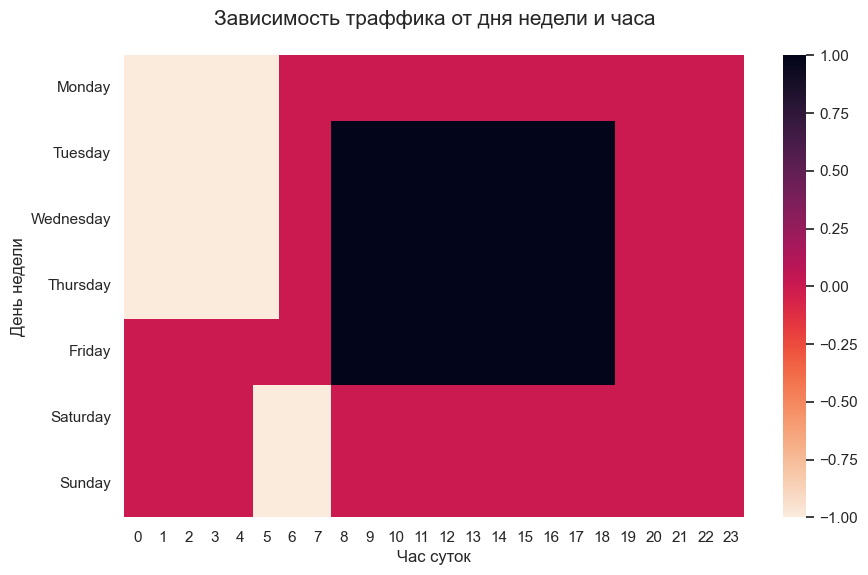

In [48]:
df["traffic"] = df["high_traffic"] - df["low_traffic"]
df_pivot_traffic = pd.pivot_table(data=df,
                                index="week_day",
                                columns="hour",
                                values="traffic")

fig, ax = plt.subplots(figsize=(10, 6))
ax = sns.heatmap(df_pivot_traffic, 
                 ax=ax, 
                 yticklabels=week_days,
                 cmap="rocket_r")

ax.set_title('Зависимость траффика от дня недели и часа\n', fontsize=15)
ax.set_ylabel('День недели', fontsize=12)
ax.set_xlabel('Час суток', fontsize=12)

plt.show()

In [49]:
df = df.drop(columns=["traffic"])

**Задание 8 (0.25 балла)**. Для каждого из замеченных вами выше 2-3 пунктов добавьте в выборку по два признака: 
- началась ли поездка в этом пункте
- закончилась ли поездка в этом пункте

Выделим два явных скопления: Аэропорт Ла-Гвардия (40.773861, -73.874710) и Международный аэропорт имени Джона Кеннеди (40.650184, -73.789826). Вокруг первого возьмем 1км радиус, а вокруг второго - 1.5км

Как вы думаете, почему эти признаки могут быть полезны?

Потому что это обычно долгие поездки + задержки на въезде в аэропорт, и модель сможет накинуть им время за это, не портя остальные признаки, то есть не подгоняясь под выбросы

In [50]:
def filter_coordinates(lat, lon, lat_c, lon_c, r):
    n = len(lat)
    dist = haversine_array(lat_c * np.ones(n), lon_c * np.ones(n), lat, lon)
    return dist <= r

def add_special_regions_features(X):
    X["pickup_airport_lg"] = filter_coordinates(X["pickup_latitude"], X["pickup_longitude"], 40.773861, -73.874710, 1.0).astype(np.int32)
    X["pickup_airport_jk"] = filter_coordinates(X["pickup_latitude"], X["pickup_longitude"], 40.650184, -73.789826, 1.5).astype(np.int32)
    X["dropoff_airport_lg"] = filter_coordinates(X["dropoff_latitude"], X["dropoff_longitude"], 40.773861, -73.874710, 1.0).astype(np.int32)
    X["dropoff_airport_jk"] = filter_coordinates(X["dropoff_latitude"], X["dropoff_longitude"], 40.650184, -73.789826, 1.5).astype(np.int32)

add_special_regions_features(df)
add_special_regions_features(X_train)
add_special_regions_features(X_test)

In [51]:
df_special_dropoff = df[df["dropoff_airport_lg"].astype(bool) + df["dropoff_airport_jk"].astype(bool)]
df_special_pickup = df[df["pickup_airport_lg"].astype(bool) | df["pickup_airport_jk"].astype(bool)]
len(df_special_dropoff) , len(df_special_pickup)

(26896, 54244)

In [52]:
show_circles_on_map(df_special_dropoff.sample(1000), "dropoff_latitude", "dropoff_longitude", "blue")

In [53]:
show_circles_on_map(df_special_dropoff.sample(1000), "pickup_latitude", "pickup_longitude", "blue")

Получилось неплохо, но видны странности: начало и конец поездки в аэропорту. Возможно, это зачастую поездки в район рядом с аэропортом. Чтобы немного пофиксить это, я сузил радиус

Для каждого из созданных признаков нарисуйте "ящик с усами" (`sns.boxplot`) распределения логарифма времени поездки

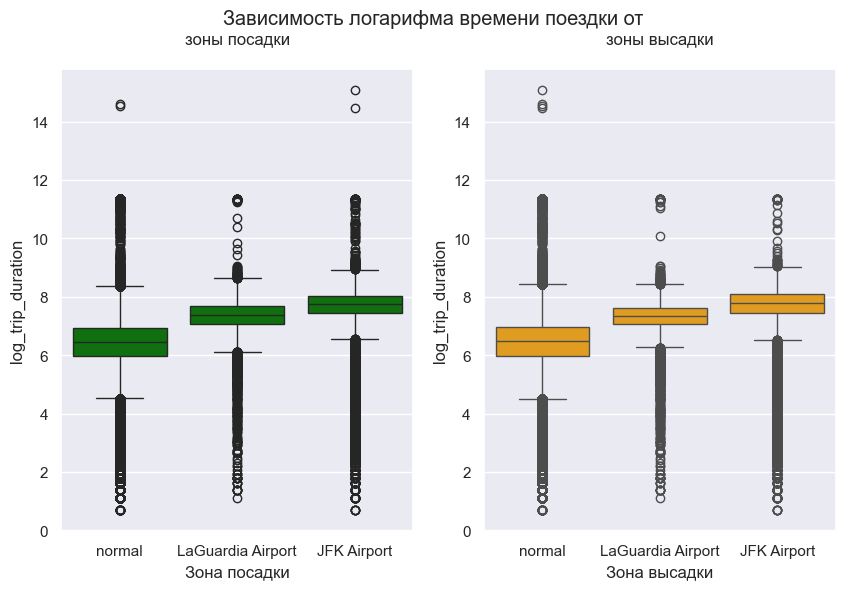

In [54]:
zones = ["normal", "LaGuardia Airport", "JFK Airport"]
df["pickup_zone"] = df["pickup_airport_lg"] + 2 * df["pickup_airport_jk"]
df["dropoff_zone"] = df["dropoff_airport_lg"] + 2 * df["dropoff_airport_jk"]

fig, ax = plt.subplots(1, 2, figsize=(10, 6))

fig.suptitle("Зависимость логарифма времени поездки от ")

sns.boxplot(df, x="pickup_zone", y="log_trip_duration", color="green", ax=ax[0])

ax[0].set_title('зоны посадки\n')
ax[0].set_xlabel('Зона посадки')
ax[0].set_xticks([0, 1, 2], labels=zones)


sns.boxplot(df, x="dropoff_zone", y="log_trip_duration", color="orange", ax=ax[1])

ax[1].set_title('зоны высадки\n')
ax[1].set_xlabel('Зона высадки')
ax[1].set_xticks([0, 1, 2], labels=zones)

plt.show()

In [55]:
df = df.drop(columns=["pickup_zone", "dropoff_zone"])

**Вопрос**: судя по графикам, как вы думаете, хорошими ли получились эти признаки?

Да, гипотеза о том, что для этих точек время поездки выше обычного - подтвердилась медианами. Кроме того, мы получили достаточно объектов в каждом признаке, чтобы это был стат значимо и модель проследила закономерность

<img src="https://www.dropbox.com/s/xson9nukz5hba7c/map.png?raw=1" align="right" width="20%" style="margin-left: 20px; margin-bottom: 20px">

**Задание 9 (1 балл)**. Сейчас мы почти что не используем сами значения координат. На это есть несколько причин: по отдельности рассматривать широту и долготу не имеет особого смысла, стоит рассматривать их вместе. Во-вторых, понятно, что зависимость между нашим таргетом и координатами не линейная. Чтобы как-то использовать координаты, можно прибегнуть к следующему трюку: обрамим область с наибольшим количеством поездок прямоугольником (как на рисунке). Разобьем этот прямоугольник на ячейки. Каждой точке сопоставим номер ее ячейки, а тем точкам, что не попали ни в одну из ячеек, сопоставим значение -1.

Напишите трансформер, который сначала разбивает показанную на рисунке область на ячейки, а затем создает два признака: номер ячейки, в которой началась поездка, и номер ячейки, в которой закончилась поездка. Количество строк и столбцов выберите самостоятельно.

Обратите внимание, что все вычисления должны быть векторизованными, трансформер не должен модифицировать передаваемую ему выборку inplace, а все необходимые статистики (если они вдруг нужны) нужно считать только по обучающей выборке в методе `fit`:

In [56]:
# вспомним, как выглядят точки

show_circles_on_map(df.sample(5000), "dropoff_latitude", "dropoff_longitude", "blue")

In [57]:
from sklearn.base import BaseEstimator, TransformerMixin


# TransformerMixin implements fit_transform for you,
# applying your fit and transform consistently
    
class MapGridTransformer(BaseEstimator, TransformerMixin):
    def __init__(self, rows=5, cols=5, mode="fixed", leave_out_lat=0, leave_out_lon=0):
        self.rows = rows
        self.cols = cols
        self.mode = mode
        self.q_lat = leave_out_lat / 2.0
        self.q_lon = leave_out_lon / 2.0
        self.lat_edges = []
        self.lon_edges = []
    
    def show_map(self, data=None, latitude_column=None, longitude_column=None, zone_column=None, 
                 m=None, colors=None, grid_color=None):
        """
        Отрисовывает карту с прямоугольниками

        Inputs:
            data - какие точки нужно отразить на карте,
            latitude_column,
            longitude_column,
            zone_column,
            m - предзаданная карта,
            colors - цвета для отрисовки групп, len(colors) >= self.rows * self.cols + 1,
            grid_color - цвет рамки
        """
        if colors is None:
            colors = sns.color_palette("husl", self.cols * self.rows + 1).as_hex()

        if grid_color is None:
            grid_color = "red"

        if m is None:
            location = ((self.lat_edges[-1] + self.lat_edges[0]) / 2, (self.lon_edges[-1] + self.lon_edges[0]) / 2)
            m = folium.Map(location=location)

        # Отрисуем точки, если они нам даны
        if data is not None:
            for _, row in data.iterrows():
                color = colors[0]
                if zone_column:
                    color = colors[row[zone_column] + 1]
                folium.Circle(
                    radius=100,
                    location=(row[latitude_column], row[longitude_column]),
                    color=color,
                    fill_color=color,
                    fill=True
                ).add_to(m)

        # Отрисуем сетку

        # Горизонтальные линии
        for lat in self.lat_edges:
            points = [[lat, self.lon_edges[0]], [lat, self.lon_edges[-1]]]
            folium.PolyLine(points, color=grid_color).add_to(m)

        # Вертикальные линии
        for lon in self.lon_edges:
            points = [[self.lat_edges[0], lon], [self.lat_edges[-1], lon]]
            folium.PolyLine(points, color=grid_color).add_to(m)

        return m
    
    def fit(self, X=None, y=None, latitude_column=None, longitude_column=None):
        if self.mode == "fixed":
            # Наперед заданная сетка Нью-Йорка
            # Подогнал на глаз под наши данные
            self.lon_edges = np.linspace(-74.017449, -73.945046, self.cols + 1)
            self.lat_edges = np.linspace(40.705691, 40.803673, self.rows + 1)
        if self.mode == "quantiles":
            # Обрежем по квантилям
            self.lon_edges = np.linspace(X[longitude_column].quantile(self.q_lon), X[longitude_column].quantile(1 - self.q_lon), self.cols + 1)
            self.lat_edges = np.linspace(X[latitude_column].quantile(self.q_lat), X[latitude_column].quantile(1 - self.q_lat), self.rows + 1)
        return self

    def transform(self, X, y=None, latitude_column=None, longitude_column=None, new_column="zone"):
        X_copy = X.copy()

        # Для каждой точки получим монотонный массив [True, ..., True, False, ..., False]
        # Последнее True - нужный номер строки
        row_pos_mask = X_copy[latitude_column].values[:, np.newaxis] > np.array(self.lat_edges)[np.newaxis, :]
        X_copy["row"] = self.rows - np.argmin(row_pos_mask.astype(np.int32), axis=1)
        X_copy.loc[(X_copy[latitude_column] <= self.lat_edges[0]) | (X_copy[latitude_column] > self.lat_edges[-1]), ["row"]] = -1

        col_pos_mask = X_copy[longitude_column].values[:, np.newaxis] > np.array(self.lon_edges)[np.newaxis, :]
        X_copy["col"] = np.argmin(col_pos_mask.astype(np.int32), axis=1) - 1
        X_copy.loc[(X_copy[longitude_column] <= self.lon_edges[0]) | (X_copy[longitude_column] > self.lon_edges[-1]), ["col"]] = -1

        X_copy[new_column] = X_copy["row"] * self.cols + X_copy["col"]
        X_copy.loc[(X_copy["row"] == -1) | (X_copy["col"] == -1), [new_column]] = -1
        X_copy[new_column] = X_copy[new_column].astype(np.int32)
        return X_copy.drop(columns=["col", "row"])

In [58]:
map_grid_tranformer_fixed = MapGridTransformer(rows=8, cols=5, mode="fixed")
map_grid_tranformer_fixed.fit(X_train)
X_transformed = map_grid_tranformer_fixed.transform(X_train, latitude_column="pickup_latitude", longitude_column="pickup_longitude", new_column="pickup_zone")
map_grid_tranformer_fixed.show_map(data=X_transformed.sample(1000), latitude_column="pickup_latitude", longitude_column="pickup_longitude", zone_column="pickup_zone")

Тут возникает справедливый вопрос: трансформер для точек прибытия и посадки должен быть единый или два разных? Аргументы есть и за один вариант, и за второй.

Зачем два разных?

1. Если есть паттерн: едут их одних районов в другие отдаленные места. Но это довольно экзотический случай: на наших данных видно, что в целом все поездки сосредоточены на маленьком участке, да и обычно если куда-то ездят такси, то и оттуда люди вероятно тоже ездят на такси в обратном направлении (в среднем)

Зачем один?

1. Нет x2 признаков
2. Сильно проще интерпретировать

Можно, к примеру, фитить сразу все точки: и посадки, и высадки. Но давайте убедимся, что если в нашей задаче точки высадки примерно также раскиданы по сетке

In [59]:
X_transformed = map_grid_tranformer_fixed.transform(X_transformed, latitude_column="dropoff_latitude", longitude_column="dropoff_longitude", new_column="dropoff_zone")
map_grid_tranformer_fixed.show_map(data=X_transformed.sample(1000), latitude_column="dropoff_latitude", longitude_column="dropoff_longitude", zone_column="dropoff_zone")

In [60]:
len(X_transformed[X_transformed["pickup_zone"] != -1]) / X_transformed.shape[0], len(X_transformed[X_transformed["dropoff_zone"] != -1]) / X_transformed.shape[0]

(0.900913765241663, 0.8498623965525685)

Да, как отмечалось выше, видно больше точек на другом берегу, но на них мы сетку и не пытались фитить.

Что еще?\
По-хорошему, надо бы реализовать фит под произвольные данные и у меня даже есть идеи как!

Можно инициализировать рамку так, чтобы в нее попали все точки, а затем итеративно пытаться сжать границы: каждый раз пытаться подвинуть границу, чтобы внутри все еще оставалось x% точек. Сдвигать можно либо каким-то шагом, который будет уменьшаться, либо в k раз, где k, например, убывающая геом. прогрессия.

Ладно, есть способ попроще - обрезать по квантилям, НО: это менее контролируемо

Но! Мы решаем нашу конкретную задачу, в которой точки сосредоточены в одной области и мы можем ее эмперически установить - зачем изобретать велосипед? ~~Так как мне дорог мой сон, а он с каждой минутой домашки сокращается, то я остановлюсь на текстовом описании общей идеи.~~ Не дорог

In [61]:
map_grid_tranformer_quantiles = MapGridTransformer(rows=8, cols=5, mode="quantiles", leave_out_lat=0.08, leave_out_lon=0.12)
map_grid_tranformer_quantiles.fit(X_train, latitude_column="pickup_latitude", longitude_column="pickup_longitude")
X_transformed = map_grid_tranformer_quantiles.transform(X_train, latitude_column="pickup_latitude", longitude_column="pickup_longitude", new_column="pickup_zone")
X_transformed = map_grid_tranformer_quantiles.transform(X_transformed, latitude_column="dropoff_latitude", longitude_column="dropoff_longitude", new_column="dropoff_zone")
map_grid_tranformer_quantiles.show_map(data=X_transformed.sample(1000), latitude_column="pickup_latitude", longitude_column="pickup_longitude", zone_column="pickup_zone")

In [62]:
len(X_transformed[X_transformed["pickup_zone"] != -1]) / X_transformed.shape[0], len(X_transformed[X_transformed["dropoff_zone"] != -1]) / X_transformed.shape[0]

(0.8308270897605406, 0.7812634053180549)

Могу уверенно сказать, что если мы решаем одну нашу задачу, то ручное задание рамки выглядит сильно увереннее. Как я и говорил, подход с квантилями менее контролируемый - мы не можем заставить рамку сдвинуться куда-то. В нашем случае плотность точек в аэропортах искусственно двигает рамку вправо(

Поэтому остановимся на фиксированной рамке

In [63]:
X_transformed = map_grid_tranformer_fixed.transform(X_train, latitude_column="pickup_latitude", longitude_column="pickup_longitude", new_column="pickup_zone")
X_transformed = map_grid_tranformer_fixed.transform(X_transformed, latitude_column="dropoff_latitude", longitude_column="dropoff_longitude", new_column="dropoff_zone")
X_transformed["pickup_zone"].value_counts()

pickup_zone
-1     101172
 17     94601
 22     85376
 18     80725
 21     72059
 26     65841
 31     50594
 14     48853
 27     45401
 12     41392
 16     40914
 13     32437
 9      31952
 35     30567
 32     27513
 7      26715
 25     25978
 30     19527
 3      18909
 23     18543
 8      14810
 20     12559
 19     10578
 11      6432
 36      6154
 4       3173
 39      2219
 2       1350
 38      1078
 34      1049
 24       969
 37       637
 29       347
 33       227
 28       226
 15       155
 5          8
 10         5
 6          4
 1          1
Name: count, dtype: int64

Нужно быть предельно аккуратным - район с малым количеством точек мы не научимся нормально предсказывать и, возможно, будем ломаться на тесте

In [64]:
def add_zone_features(X, transformer):
    X = transformer.transform(X, latitude_column="pickup_latitude", longitude_column="pickup_longitude", new_column="pickup_zone")
    X = transformer.transform(X, latitude_column="dropoff_latitude", longitude_column="dropoff_longitude", new_column="dropoff_zone")
    return X

df = add_zone_features(df, map_grid_tranformer_fixed)
X_train = add_zone_features(X_train, map_grid_tranformer_fixed)
X_test = add_zone_features(X_test, map_grid_tranformer_fixed)

In [65]:
df.head()

,vendor_id,pickup_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,log_trip_duration,date,week_day,month,hour,is_anomaly_jan,is_anomaly_may,day_of_year,haversine,log_haversine,trip_duration,high_traffic,low_traffic,pickup_airport_lg,pickup_airport_jk,dropoff_airport_lg,dropoff_airport_jk,pickup_zone,dropoff_zone
0,2,2016-03-14 17:24:55,1,-73.982155,40.767937,-73.964630,40.765602,N,6.122493,2016-03-14,0,3,17,0,0,74,1.498521,0.915699,455.0,0,0,0,0,0,0,12,18
1,1,2016-06-12 00:43:35,1,-73.980415,40.738564,-73.999481,40.731152,N,6.498282,2016-06-12,6,6,0,0,0,164,1.805507,1.031584,663.0,0,0,0,0,0,0,27,26
2,2,2016-01-19 11:35:24,1,-73.979027,40.763939,-74.005333,40.710087,N,7.661527,2016-01-19,1,1,11,0,0,19,6.385098,1.999464,2124.0,1,0,0,0,0,0,17,35
3,2,2016-04-06 19:32:31,1,-74.010040,40.719971,-74.012268,40.706718,N,6.063785,2016-04-06,2,4,19,0,0,97,1.485498,0.910473,429.0,0,0,0,0,0,0,30,35
4,2,2016-03-26 13:30:55,1,-73.973053,40.793209,-73.972923,40.782520,N,6.077642,2016-03-26,5,3,13,0,0,86,1.188588,0.783257,435.0,0,0,0,0,0,0,3,8


**Задание 10 (0.25 балла)**. Обучите `Ridge`-регрессию со стандартными параметрами на признаках, которые мы выделили к текущему моменту. Категориальные признаки закодируйте через one-hot-кодирование, числовые признаки отмасштабируйте.

In [66]:
categorical_f = ["hour", "week_day", "day_of_year", "month", "pickup_zone", "dropoff_zone"]
numeric_f = ["log_haversine"]
other_f = ["is_anomaly_jan", "is_anomaly_may", "high_traffic", "low_traffic", "pickup_airport_lg", "pickup_airport_jk", "dropoff_airport_lg", "dropoff_airport_jk"]

model, y_pred = fit_predict_cat_num(X_train, y_train, X_test, y_test, categorical_f=categorical_f, numeric_f=numeric_f, other_f=other_f)

Train RMSLE = 0.4706
Test RMSLE = 0.4701


Ooo, напоминаю, что результаты пока такие:

1. 0.4701 - +использование координат
2. 0.7871 - только фичи времени начала поездки
3. 0.7950 - бейзлайн среднее

## Часть 3. Изучаем оставшиеся признаки (1 балл)

**Задание 11 (0.75 баллов)**. У нас осталось еще 3 признака, которые мы не исследовали: `vendor_id`, `passenger_count` и `store_and_fwd_flag`.

**Вопрос**: Подумайте, почему каждый из этих признаков может быть потенциально полезным.

`vendor_id` - возможно, одна компания в среднем быстрее или их заказы разбиты на районы\
`passenger_count` - если число пассажиров свыше 4, то это уже могут быть минивены и дальние поездки\
`store_and_fwd_flag` - если данные отправились не сразу после поездки, то возможно есть еще проблема с координатами -> какой-то шум, который должен буде попасть в этот вес

Посчитайте, сколько есть уникальных значений у каждого из этих признаков:

In [67]:
df["vendor_id"].value_counts(), df["passenger_count"].value_counts(), df["store_and_fwd_flag"].value_counts()

(vendor_id
 2    780302
 1    678342
 Name: count, dtype: int64,
 passenger_count
 1    1033540
 2     210318
 5      78088
 3      59896
 6      48333
 4      28404
 0         60
 7          3
 9          1
 8          1
 Name: count, dtype: int64,
 store_and_fwd_flag
 N    1450599
 Y       8045
 Name: count, dtype: int64)

Постройте "ящики с усами" распределений логарифма времени поездки в зависимости от значений каждого из признаков

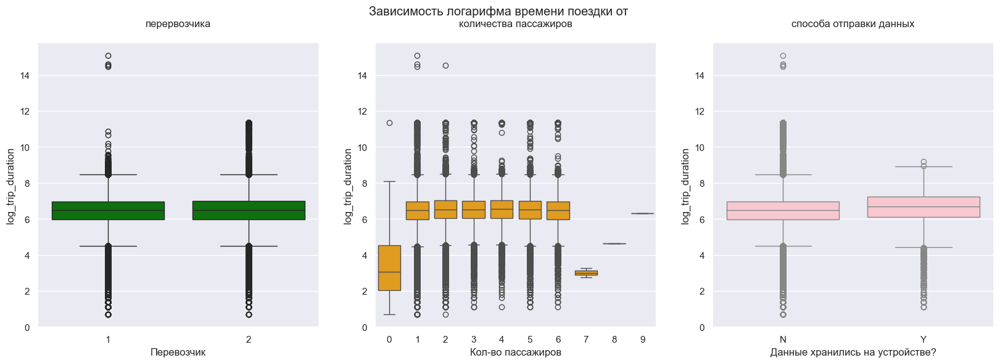

In [68]:
fig, ax = plt.subplots(1, 3, figsize=(20, 6))

fig.suptitle("Зависимость логарифма времени поездки от ")

sns.boxplot(df, x="vendor_id", y="log_trip_duration", ax=ax[0], color="green")

ax[0].set_title('перервозчика\n')
ax[0].set_xlabel('Перевозчик')


sns.boxplot(df, x="passenger_count", y="log_trip_duration", ax=ax[1], color="orange")

ax[1].set_title('количества пассажиров\n')
ax[1].set_xlabel('Кол-во пассажиров')

sns.boxplot(df, x="store_and_fwd_flag", y="log_trip_duration", ax=ax[2], color="pink")

ax[2].set_title('способа отправки данных\n')
ax[2].set_xlabel('Данные хранились на устройстве?')

plt.show()

Переведите признаки `vendor_id` и `store_and_fwd_flag` в значения $\{0;1\}$

In [69]:
def transform_vendor_n_store(X):
    X_copy = X.copy()
    X_copy["vendor_id"] = X_copy["vendor_id"] - 1
    X_copy.loc[X_copy["store_and_fwd_flag"] == "N", ["store_and_fwd_flag"]] = 0
    X_copy.loc[X_copy["store_and_fwd_flag"] == "Y", ["store_and_fwd_flag"]] = 1
    return X_copy

df = transform_vendor_n_store(df)
X_train = transform_vendor_n_store(X_train)
X_test = transform_vendor_n_store(X_test)
df.head()

,vendor_id,pickup_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,log_trip_duration,date,week_day,month,hour,is_anomaly_jan,is_anomaly_may,day_of_year,haversine,log_haversine,trip_duration,high_traffic,low_traffic,pickup_airport_lg,pickup_airport_jk,dropoff_airport_lg,dropoff_airport_jk,pickup_zone,dropoff_zone
0,1,2016-03-14 17:24:55,1,-73.982155,40.767937,-73.964630,40.765602,0,6.122493,2016-03-14,0,3,17,0,0,74,1.498521,0.915699,455.0,0,0,0,0,0,0,12,18
1,0,2016-06-12 00:43:35,1,-73.980415,40.738564,-73.999481,40.731152,0,6.498282,2016-06-12,6,6,0,0,0,164,1.805507,1.031584,663.0,0,0,0,0,0,0,27,26
2,1,2016-01-19 11:35:24,1,-73.979027,40.763939,-74.005333,40.710087,0,7.661527,2016-01-19,1,1,11,0,0,19,6.385098,1.999464,2124.0,1,0,0,0,0,0,17,35
3,1,2016-04-06 19:32:31,1,-74.010040,40.719971,-74.012268,40.706718,0,6.063785,2016-04-06,2,4,19,0,0,97,1.485498,0.910473,429.0,0,0,0,0,0,0,30,35
4,1,2016-03-26 13:30:55,1,-73.973053,40.793209,-73.972923,40.782520,0,6.077642,2016-03-26,5,3,13,0,0,86,1.188588,0.783257,435.0,0,0,0,0,0,0,3,8


**Вопрос**: Основываясь на графиках выше, как вы думаете, будут ли эти признаки сильными?

Гипотеза про прямую зависимость между временем и количеством пассажиров/перевозчиком не подтвердилась. Однако, они все еще могут быть полезно в паре с другими признаками.\
А вот информация о хранении данных на устройствах - небольшу пользу все-таки имеет: поездки, когда данные отправлялись не сразу, чуть дольше (это могут быть отдаленные районы), а также в них нет значительных выбросов.

**Задание 12 (0.25 баллов)**. Проверьте свои предположения, обучив модель в том числе и на этих трех признаках. Обучайте `Ridge`-регрессию со стандартными параметрами. Категориальные признаки закодируйте one-hot-кодированием, а численные отмасштабируйте.

На этом этапе я впервые всерьез задумался о том, насколько корректно считать бинарные признаки как численные 0 и 1, а не делать над ним OHE. Так вот, ответ тут прост - любой линейной модели (со свободным членом) после преобразования бинарных признаков можно сопоставить (== для любых входов мы будем получать одинаковые ответы) модель с изначальными бинарными признаками. Показать это очень легко.

Пусть $f_{binary}$ - изначальный признак, а $(f_0, f_1) = OHE(f_{binary})$. Тогда $f_1 = f_{binary}$ и $f_0 = 1 - f_{binary}$

$$\alpha f_0 + \beta f_1 = \alpha (1 - f_{binary}) + \beta f_{binary} = \alpha + (\beta - \alpha)f_{binary}$$

То есть нам достаточно поменять лишь свободный член на $+\alpha$ и сделать нужный коэф для $f_{binary}$, не затрагивая остальные веса.

В обратную сторону переход очевиден ("ДОКАЖИТЕ", как любят в таких ситуациях писать в конспектах). Вопрос был лишь в том, а не появится ли у модели дополнительная свобода при таком переходе к 2м признакам вместо одного

In [70]:
categorical_f = ["hour", "week_day", "day_of_year", "month", "pickup_zone", "dropoff_zone"]
numeric_f = ["log_haversine", "passenger_count"]
other_f = ["is_anomaly_jan", "is_anomaly_may", "high_traffic", "low_traffic", 
           "pickup_airport_lg", "pickup_airport_jk", "dropoff_airport_lg", "dropoff_airport_jk",
           "vendor_id", "store_and_fwd_flag"]

model, y_pred = fit_predict_cat_num(X_train, y_train, X_test, y_test, categorical_f=categorical_f, numeric_f=numeric_f, other_f=other_f)
y_train_pred = model.predict(X_train)

Train RMSLE = 0.4704
Test RMSLE = 0.4699


Если признаки не дали какого-то ощутимого улучшения метрики, их можно выбросить из данных.

Как и ожидалось, не дали - прошлый скор был 0.4701

In [71]:
df = df.drop(columns=["vendor_id", "store_and_fwd_flag", "passenger_count"])
X_train = X_train.drop(columns=["vendor_id", "store_and_fwd_flag", "passenger_count"])
X_test = X_test.drop(columns=["vendor_id", "store_and_fwd_flag", "passenger_count"])

## Часть 4. Улучшаем модель (3 балла)

**Задание 13 (1 балл)**. В наших данных есть нетипичные объекты (выбросы, или outliers): с аномально маленьким времени поездки, с очень большим пройденным расстоянием или очень большими остатками регрессии. В этом задании предлагается исключить такие объекты из обучающей выборки. Для этого нарисуйте гистограммы распределения упомянутых выше величин, выберите объекты, которые можно назвать выбросами, и очистите __обучающую выборку__ от них.

Отметим, что хотя эти объекты и выглядят как выбросы, в тестовой выборке тоже скорее всего будут объекты с такими же странными значениями целевой переменной и/или признаков. Поэтому, возможно, чистка обучающей выборки приведёт к ухудшению качества на тесте. Тем не менее, всё равно лучше удалять выбросы из обучения, чтобы модель получалась более разумной и интерпретируемой.

In [72]:
X_train["trip_duration_m"] = np.expm1(y_train) / 60
X_train["target_delta"] = y_train - y_train_pred

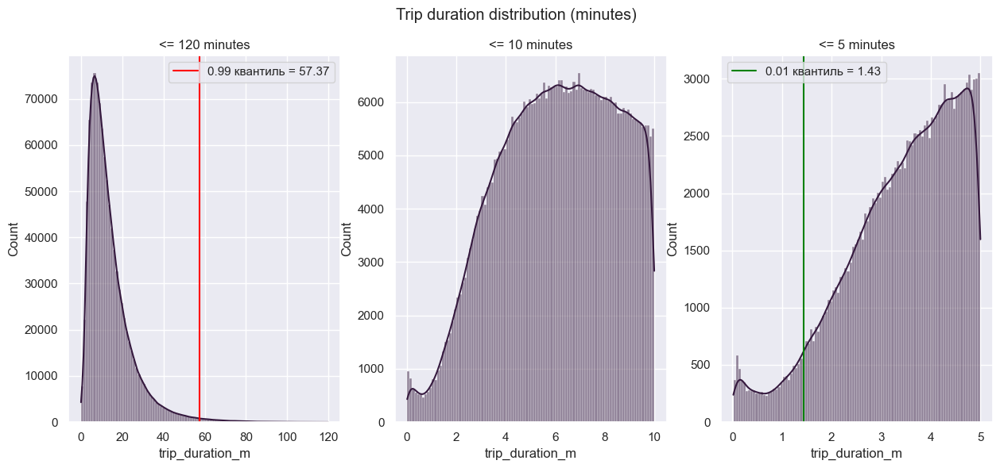

In [73]:
fig, ax = plt.subplots(1, 3, figsize=(15, 6))

plt.suptitle("Trip duration distribution (minutes)")

sns.histplot(data=X_train[X_train.trip_duration_m <= 120], x="trip_duration_m", bins=100, kde=True, ax=ax[0])
ax[0].set_title("<= 120 minutes")

q_99 = X_train["trip_duration_m"].quantile(0.99)
ax[0].axvline(x=q_99, c='r', label=f"{0.99} квантиль = {np.round(q_99, 2)}")
ax[0].legend()

sns.histplot(data=X_train[X_train.trip_duration_m <= 10], x="trip_duration_m", bins=100, kde=True, ax=ax[1])
ax[1].set_title("<= 10 minutes")

sns.histplot(data=X_train[X_train.trip_duration_m <= 5], x="trip_duration_m", bins=100, kde=True, ax=ax[2])
ax[2].set_title("<= 5 minutes")

q_1 = X_train["trip_duration_m"].quantile(0.01)
ax[2].axvline(x=q_1, c='g', label=f"{0.01} квантиль = {np.round(q_1, 2)}")
ax[2].legend()



plt.show()

Тут не будем сильно грубить - отрежем по 0.8 минутам и 70 (чтобы избавиться от тяжелого хвоста)

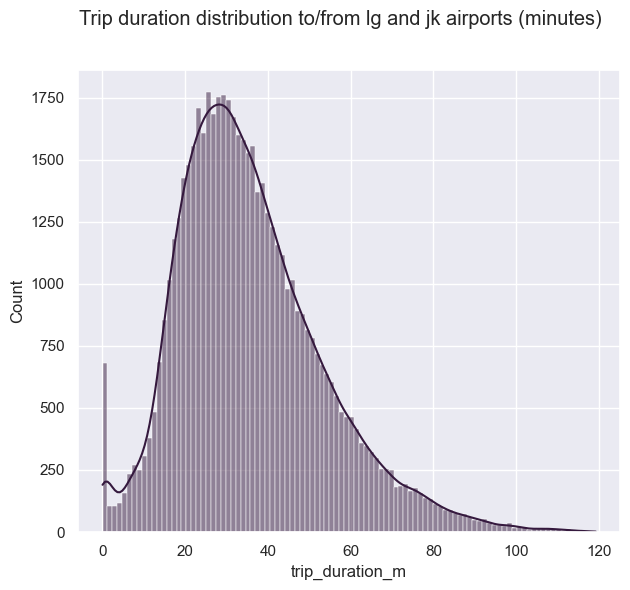

In [74]:
fig, ax = plt.subplots(1, 1, figsize=(7, 6))

plt.suptitle("Trip duration distribution to/from lg and jk airports (minutes)")

sns.histplot(data=X_train[(X_train.dropoff_airport_jk | X_train.pickup_airport_jk | X_train.dropoff_airport_lg | X_train.pickup_airport_lg) & (X_train.trip_duration_m < 120)], 
             x="trip_duration_m", bins=100, kde=True, ax=ax)
plt.show()

Если так сильно обрезать, то потеряем хорошие данные про аэропорты. Обрежем, как и было, по 120 минутам

In [75]:
filter_trip_duration_mask = X_train.trip_duration_m.between(0.7, 120)
print(f"Теряем {np.round(1 - np.mean(filter_trip_duration_mask), 4) * 100}% данных")

Теряем 0.58% данных


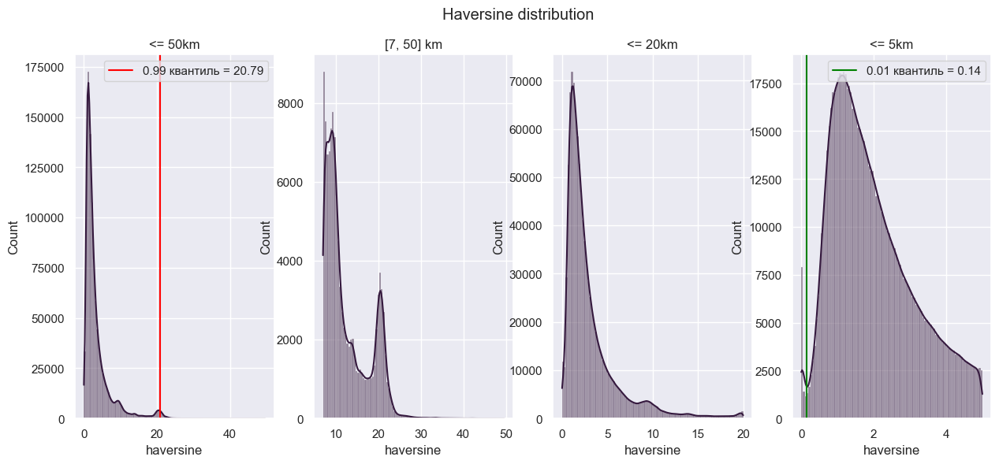

In [76]:
fig, ax = plt.subplots(1, 4, figsize=(15, 6))

plt.suptitle("Haversine distribution")

sns.histplot(data=X_train[X_train.haversine <= 50], x="haversine", bins=100, kde=True, ax=ax[0])
ax[0].set_title("<= 50km")

q_99 = X_train["haversine"].quantile(0.99)
ax[0].axvline(x=q_99, c='r', label=f"{0.99} квантиль = {np.round(q_99, 2)}")
ax[0].legend()

sns.histplot(data=X_train[(X_train.haversine >= 7) & (X_train.haversine <= 50)], x="haversine", bins=100, kde=True, ax=ax[1])
ax[1].set_title("[7, 50] km")

sns.histplot(data=X_train[X_train.haversine <= 20], x="haversine", bins=100, kde=True, ax=ax[2])
ax[2].set_title("<= 20km")

sns.histplot(data=X_train[X_train.haversine <= 5], x="haversine", bins=100, kde=True, ax=ax[3])
ax[3].set_title("<= 5km")

q_1 = X_train["haversine"].quantile(0.01)
ax[3].axvline(x=q_1, c='g', label=f"{0.01} квантиль = {np.round(q_1, 2)}")
ax[3].legend()



plt.show()

Тут уберем весь 1% квантиль - это поездки "на месте", а вот справа обрежем по 40км, так как пик на 20 - это, вероятно, наши два аэропорта (это так и есть) и они нам очень уж нужны

In [77]:
len(X_train[(X_train.haversine.between(16, 22)) & (X_train.dropoff_airport_jk | X_train.pickup_airport_jk)]) / len(X_train[(X_train.haversine.between(16, 22))]),\
len(X_train[(X_train.haversine.between(16, 22)) & (X_train.dropoff_airport_lg | X_train.pickup_airport_lg)]) / len(X_train[(X_train.haversine.between(16, 22))])

(0.8094020456333596, 0.015381589299763965)

In [78]:
filter_haversine_mask = X_train.haversine.between(X_train.haversine.quantile(0.01), 40)
print(f"Теряем {np.round(1 - np.mean(filter_haversine_mask), 4) * 100}% данных")

Теряем 1.01% данных


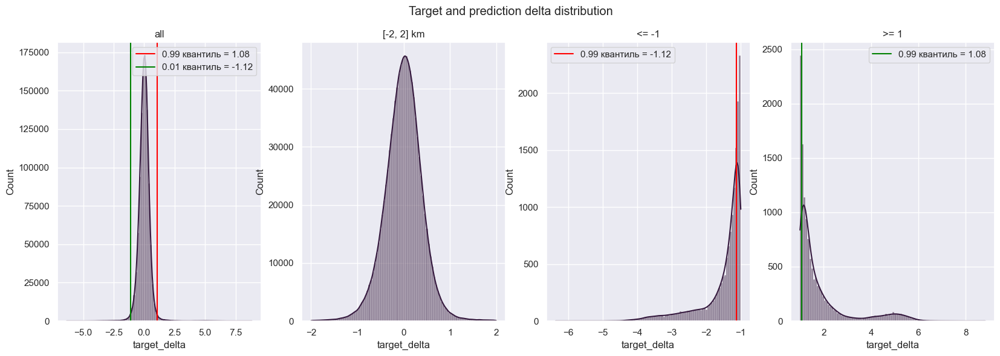

In [79]:
fig, ax = plt.subplots(1, 4, figsize=(20, 6))

plt.suptitle("Target and prediction delta distribution")

sns.histplot(data=X_train, x="target_delta", bins=100, kde=True, ax=ax[0])
ax[0].set_title("all")

q_99 = X_train["target_delta"].quantile(0.99)
ax[0].axvline(x=q_99, c='r', label=f"{0.99} квантиль = {np.round(q_99, 2)}")

q_1 = X_train["target_delta"].quantile(0.01)
ax[0].axvline(x=q_1, c='g', label=f"{0.01} квантиль = {np.round(q_1, 2)}")
ax[0].legend()

sns.histplot(data=X_train[(X_train.target_delta >= -2) & (X_train.target_delta <= 2)], x="target_delta", bins=100, kde=True, ax=ax[1])
ax[1].set_title("[-2, 2] km")

sns.histplot(data=X_train[X_train.target_delta <= -1], x="target_delta", bins=100, kde=True, ax=ax[2])
ax[2].set_title("<= -1")
ax[2].axvline(x=q_1, c='r', label=f"{0.99} квантиль = {np.round(q_1, 2)}")
ax[2].legend()

sns.histplot(data=X_train[X_train.target_delta >= 1], x="target_delta", bins=100, kde=True, ax=ax[3])
ax[3].set_title(">= 1")
ax[3].axvline(x=q_99, c='g', label=f"{0.99} квантиль = {np.round(q_99, 2)}")
ax[3].legend()



plt.show()

Тут виден сильный выброс в районе [3,5; 6] - какая-то абсолютно нереальная ошибка на 4+ порядка - посмотрим, что это за данные

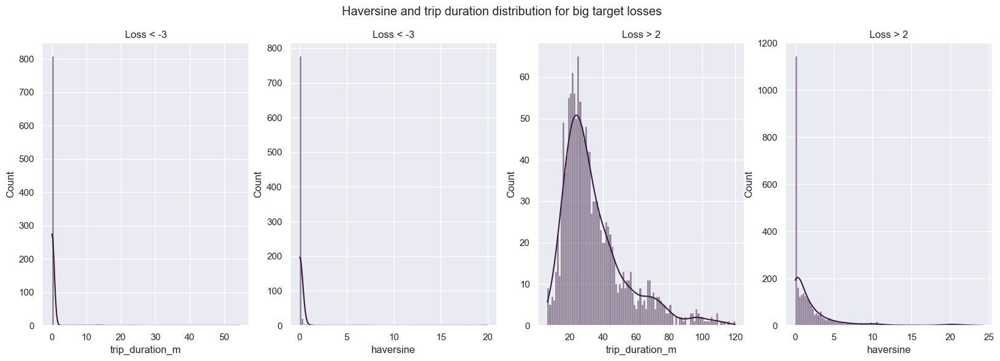

In [80]:
fig, ax = plt.subplots(1, 4, figsize=(20, 6))

plt.suptitle("Haversine and trip duration distribution for big target losses")

sns.histplot(data=X_train[(X_train.target_delta < -3) & (X_train.trip_duration_m < 120)], x="trip_duration_m", bins=100, kde=True, ax=ax[0])
ax[0].set_title("Loss < -3")
sns.histplot(data=X_train[(X_train.target_delta < -3) & (X_train.haversine < 30)], x="haversine", bins=100, kde=True, ax=ax[1])
ax[1].set_title("Loss < -3")
sns.histplot(data=X_train[(X_train.target_delta > 2) & (X_train.trip_duration_m < 120)], x="trip_duration_m", bins=100, kde=True, ax=ax[2])
ax[2].set_title("Loss > 2")
sns.histplot(data=X_train[(X_train.target_delta > 2) & (X_train.haversine < 30)], x="haversine", bins=100, kde=True, ax=ax[3])
ax[3].set_title("Loss > 2")

plt.show()

In [81]:
filter_target_mask = X_train.target_delta.between(-3, 2)
print(f"Теряем {np.round((1 - np.mean(filter_target_mask)) * 100, 2)}% данных")

Теряем 0.37% данных


Ничего не попортили и славно

In [82]:
filter_mask = (filter_target_mask & filter_haversine_mask & filter_trip_duration_mask)
print(f"Теряем {np.round((1 - np.mean(filter_mask)) * 100, 2)}% данных")

Теряем 1.27% данных


In [83]:
X_train, y_train = X_train[filter_mask], y_train[filter_mask]

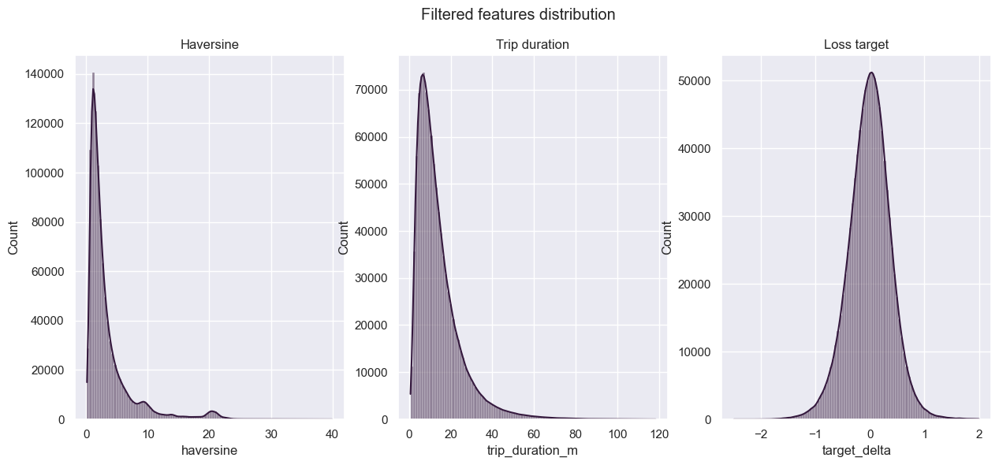

In [84]:
fig, ax = plt.subplots(1, 3, figsize=(15, 6))

plt.suptitle("Filtered features distribution")

sns.histplot(data=X_train, x="haversine", bins=100, kde=True, ax=ax[0])
ax[0].set_title("Haversine")

sns.histplot(data=X_train, x="trip_duration_m", bins=100, kde=True, ax=ax[1])
ax[1].set_title("Trip duration")

sns.histplot(data=X_train, x="target_delta", bins=100, kde=True, ax=ax[2])
ax[2].set_title("Loss target")

plt.show()

Какая красота!!!

In [85]:
X_train = X_train.drop(columns=["target_delta", "trip_duration_m"])

Сейчас у нас очень много категориальных признаков. В категориальных признаках могут содержаться редкие категории, обычно это плохо: модель сильно переобучается на таких примерах. Для каждого категориального признака объедините действительно редкие категории в одну, если такие имеются (т.е. если категории действительно редкие). 

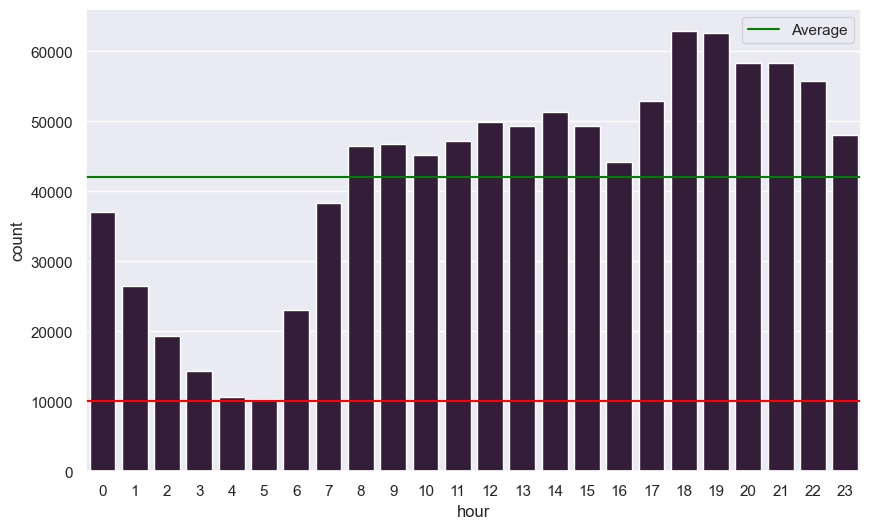

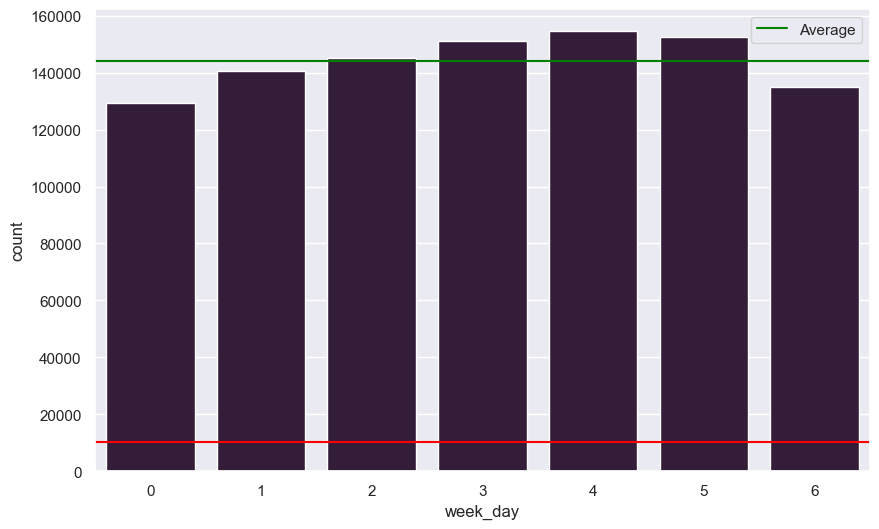

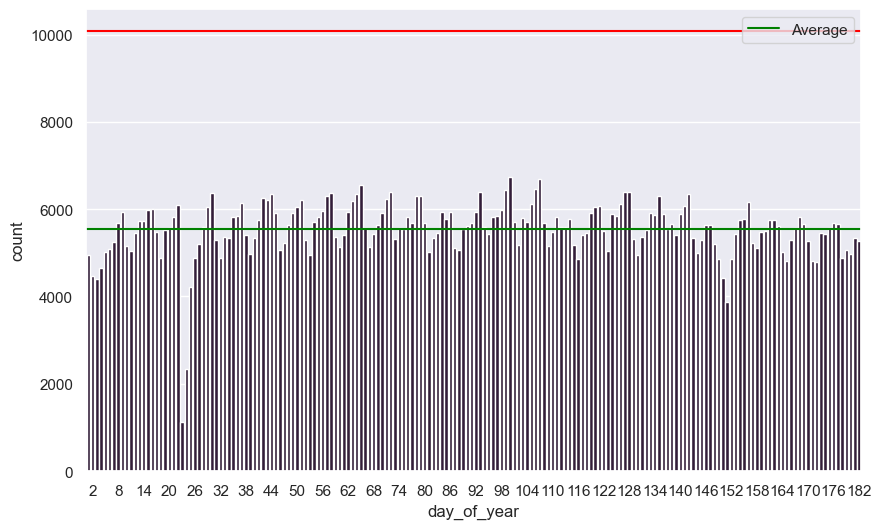

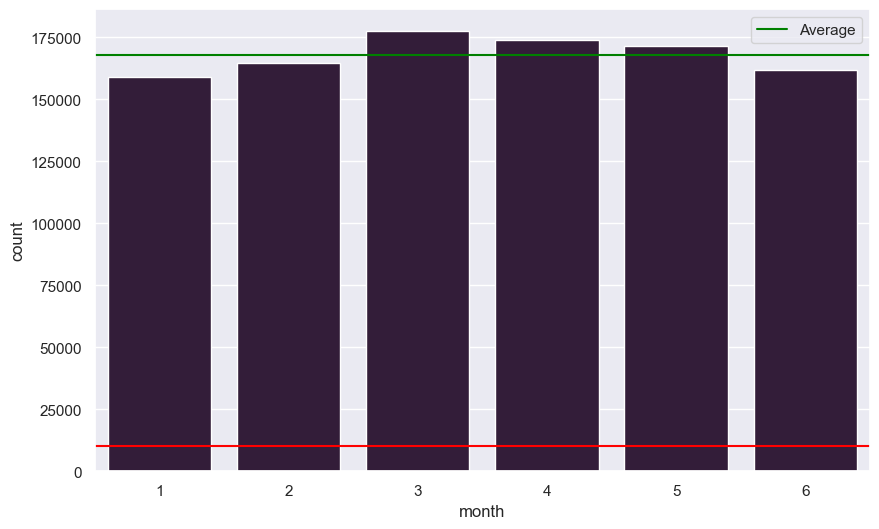

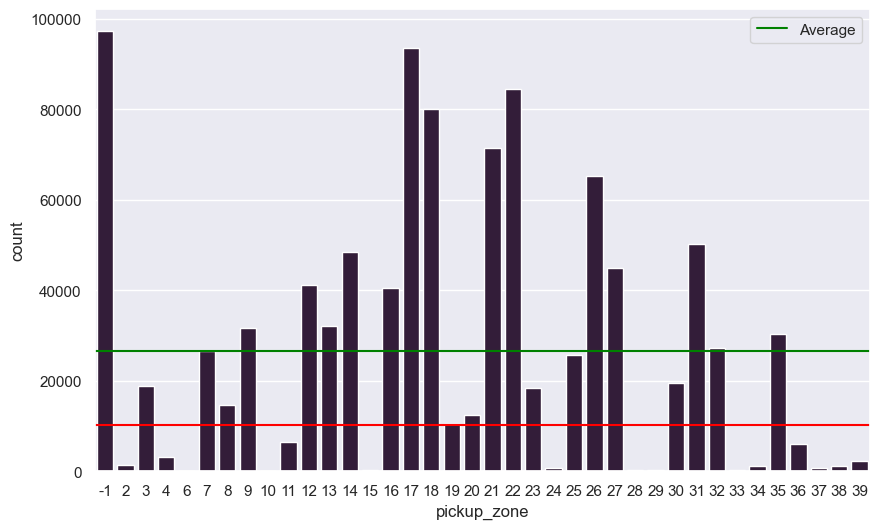

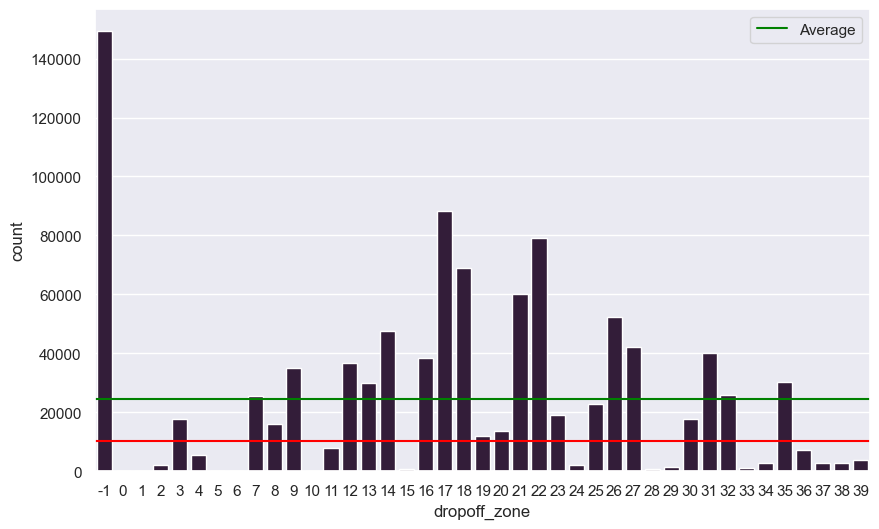

In [86]:
def draw_cat_feature_distribution(data, feature_column, threshold=0.01):
    fig, ax = plt.subplots(1, 1, figsize=(10, 6))

    sns.countplot(data, x=feature_column, ax=ax)
    ax.axhline(y=(data.shape[0] * threshold), color="r")
    ax.axhline(y=data[feature_column].value_counts().mean(), color="g", label="Average")

    unique_cnt = len(np.unique(data[feature_column]))
    if unique_cnt > 50:
        ax.set_xticks(np.sort(np.unique(data[feature_column]))[:: unique_cnt // 30])


    plt.legend()
    plt.show()

categorical_f = ["hour", "week_day", "day_of_year", "month", "pickup_zone", "dropoff_zone"]

for feature_column in categorical_f:
    draw_cat_feature_distribution(X_train, feature_column)

В признаках времени редких категорий - нет. Даже в часе в сутках везде есть хотя бы 10к записей - 1% от датасета, что вполне достаточно для обучения. В днях годах "редкие" только найденные нами аномалии, а не редкая метка - мы их отдельно обработали. Объединить можно только зоны - они еще и одинаковы для посадки и высадки, что является большим плюсом к интерпретируемости

In [87]:
def merge_rare_zones(X):
    rare_zones = [0, 1, 2, 4, 5, 6, 10, 11, 15, 24, 28, 29, 33, 34, 36, 37, 38, 39]
    X.loc[X.pickup_zone.isin(rare_zones), ["pickup_zone"]] = 40
    X.loc[X.dropoff_zone.isin(rare_zones), ["dropoff_zone"]] = 40

merge_rare_zones(df)
merge_rare_zones(X_train)
merge_rare_zones(X_test)

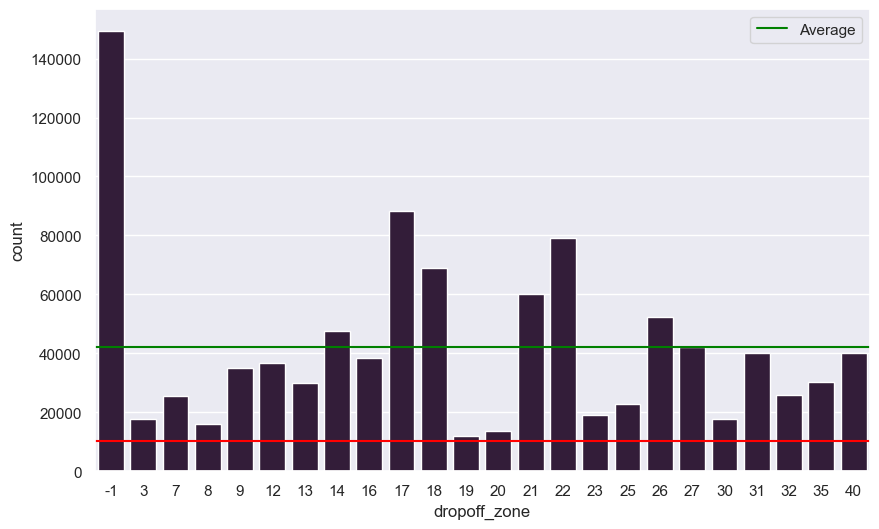

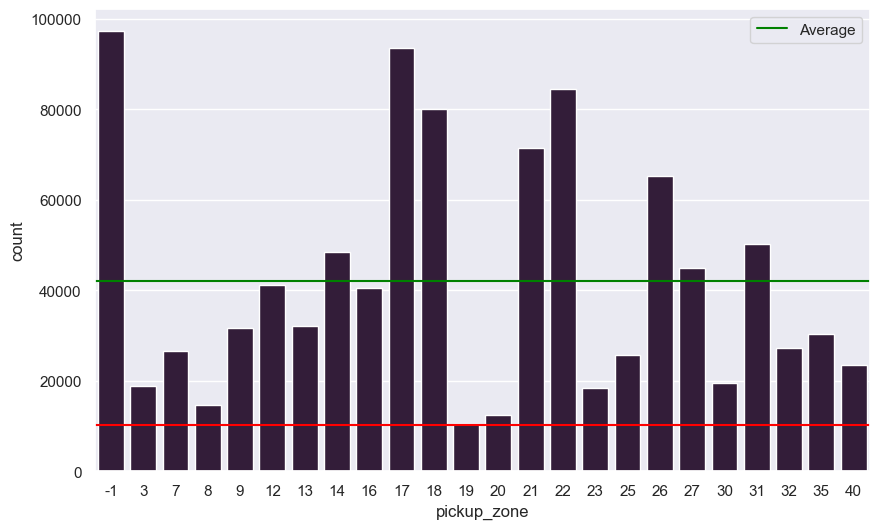

In [88]:
draw_cat_feature_distribution(X_train, "dropoff_zone")
draw_cat_feature_distribution(X_train, "pickup_zone")

Обучите модель на очищенных данных и посчитайте качество на тестовой выборке.

In [89]:
categorical_f = ["hour", "week_day", "day_of_year", "month", "pickup_zone", "dropoff_zone"]
numeric_f = ["log_haversine"]
other_f = ["is_anomaly_jan", "is_anomaly_may", "high_traffic", "low_traffic", "pickup_airport_lg", "pickup_airport_jk", "dropoff_airport_lg", "dropoff_airport_jk"]

model, y_pred = fit_predict_cat_num(X_train, y_train, X_test, y_test, categorical_f=categorical_f, numeric_f=numeric_f, other_f=other_f)

Train RMSLE = 0.3880
Test RMSLE = 0.4708


Лучше не стало, но мы старались(

Если реальные данные для модели будут без странных 0й и незакончившихся поездок, то качество будет значительно лучше

**Задание 14 (1 балл)**. После OneHot-кодирования количество признаков в нашем датасете сильно возрастает. Посчитайте колиество признаков до и после кодирования категориальных признаков.

In [90]:
categorical_f = ["hour", "week_day", "day_of_year", "month", "pickup_zone", "dropoff_zone"]
numeric_f = ["log_haversine"]
other_f = ["is_anomaly_jan", "is_anomaly_may", "high_traffic", "low_traffic", "pickup_airport_lg", "pickup_airport_jk", "dropoff_airport_lg", "dropoff_airport_jk"]

column_transformer = ColumnTransformer([
    ('ohe', OneHotEncoder(handle_unknown="ignore"), categorical_f),
    ('scaling', StandardScaler(), numeric_f),
    ("other_pass", "passthrough", other_f)
])

column_transformer.fit(X_train)

ColumnTransformer(transformers=[('ohe', OneHotEncoder(handle_unknown='ignore'),
                                 ['hour', 'week_day', 'day_of_year', 'month',
                                  'pickup_zone', 'dropoff_zone']),
                                ('scaling', StandardScaler(),
                                 ['log_haversine']),
                                ('other_pass', 'passthrough',
                                 ['is_anomaly_jan', 'is_anomaly_may',
                                  'high_traffic', 'low_traffic',
                                  'pickup_airport_lg', 'pickup_airport_jk',
                                  'dropoff_airport_lg',
                                  'dropoff_airport_jk'])])

In [91]:
print(f"Number of features before OHE: {X_train.shape[1]}")
print(f"Number of features after OHE: {column_transformer.transform(X_train).shape[1]}")
print(f"Number of coefficients in the model: {len(model[-1].coef_)}")

Number of features before OHE: 22
Number of features after OHE: 276
Number of coefficients in the model: 276


Попробуйте обучить не `Ridge`-, а `Lasso`-регрессию. Какой метод лучше?

In [92]:
def apply_pipeline(X_train, y_train, X_test, y_test, pipeline, name="Model"):
    model = pipeline.fit(X_train, y_train)
    y_train_pred = model.predict(X_train)
    y_pred = model.predict(X_test)

    print(f"{name} score:")
    print("Train RMSLE = %.4f" % rmsle(y_train, y_train_pred))
    print("Test RMSLE = %.4f" % rmsle(y_test, y_pred))
    print()
    return model, y_pred

In [93]:
pipeline_Lasso = Pipeline(steps=[
    ('ohe_and_scaling', column_transformer),
    ('regression', Lasso())
])

pipeline_Ridge = Pipeline(steps=[
    ('ohe_and_scaling', column_transformer),
    ('regression', Ridge())
])

In [94]:
model_lasso, y_lasso = apply_pipeline(X_train, y_train, X_test, y_test, pipeline_Lasso, name="Lasso")
model_ridge, y_ridge = apply_pipeline(X_train, y_train, X_test, y_test, pipeline_Ridge, name="Ridge")

Lasso score:
Train RMSLE = 0.7288
Test RMSLE = 0.7951

Ridge score:
Train RMSLE = 0.3880
Test RMSLE = 0.4708



Мдаааа, как будто 15 часов мучений были зря...

Разбейте _обучающую выборку_ на обучающую и валидационную в отношении 8:2. По валидационной выборке подберите оптимальные значения параметра регуляризации (по логарифмической сетке) для `Ridge` и `Lasso`, на тестовой выборке измерьте качество лучшей полученной модели.

In [95]:
from sklearn.model_selection import GridSearchCV, PredefinedSplit

In [96]:
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.2, random_state=42)
split_index = np.hstack([np.full(X_train.shape[0], -1), np.full(X_val.shape[0], 0)])
pds = PredefinedSplit(test_fold=split_index)
X_train = pd.concat((X_train, X_val), axis=0)
y_train = pd.concat((y_train, y_val), axis=0)

По-хорошему, конечно, ее нужно было разбивать до добавления новых фичей, потому что валидация, к примеру, уже отфильтрована от выбросов

In [120]:
alpha_range = np.logspace(-4, 3, 10)

grid_search_Lasso = GridSearchCV(Lasso(), param_grid={"alpha": alpha_range}, scoring='neg_root_mean_squared_error', cv=pds, verbose=3)
    
pipeline_Lasso_gs = Pipeline(steps=[
    ('ohe_and_scaling', column_transformer),
    ('regression', grid_search_Lasso)
])

grid_search_Ridge = GridSearchCV(Ridge(), param_grid={"alpha": alpha_range}, scoring='neg_root_mean_squared_error', cv=pds, verbose=3)
    
pipeline_Ridge_gs = Pipeline(steps=[
    ('ohe_and_scaling', column_transformer),
    ('regression', grid_search_Ridge)
])

In [227]:
model_lasso_gs, y_lasso_gs = apply_pipeline(X_train, y_train, X_test, y_test, pipeline_Lasso_gs, name="Lasso with GridSearch")
model_ridge_gs, y_ridge_gs = apply_pipeline(X_train, y_train, X_test, y_test, pipeline_Ridge_gs, name="Ridge with GridSearch")

Fitting 1 folds for each of 10 candidates, totalling 10 fits
[CV 1/1] END .....................alpha=0.0001;, score=-0.389 total time=  33.0s
[CV 1/1] END ......alpha=0.0005994842503189409;, score=-0.391 total time=   8.5s
[CV 1/1] END .......alpha=0.003593813663804626;, score=-0.409 total time=   3.0s
[CV 1/1] END .......alpha=0.021544346900318846;, score=-0.433 total time=   1.2s
[CV 1/1] END .........alpha=0.1291549665014884;, score=-0.468 total time=   0.8s
[CV 1/1] END ..........alpha=0.774263682681127;, score=-0.728 total time=   0.5s
[CV 1/1] END ..........alpha=4.641588833612782;, score=-0.728 total time=   0.5s
[CV 1/1] END .........alpha=27.825594022071257;, score=-0.728 total time=   0.5s
[CV 1/1] END .........alpha=166.81005372000593;, score=-0.728 total time=   0.5s
[CV 1/1] END .....................alpha=1000.0;, score=-0.728 total time=   0.5s
Lasso with GridSearch score:
Train RMSLE = 0.3883
Test RMSLE = 0.4711

Fitting 1 folds for each of 10 candidates, totalling 10 fi

Давайте все же попробуем сделать честную валидацию - разобьем тест пополам

In [253]:
# Чтобы не запутаться, датасет выглядит вот так:

# |----------------X_train----------------|----------X_test--------|
# |-----------------------|-----X_val-----|----------X_test--------|
# |----------------X_train----------------|--X_val_2--|--X_test_2--| -> этим мы и будем пользоваться, ибо это корректнее
# |----------------------X_train_2--------------------|--X_test_2--|

# C точностью до решафла частей
# Немного сложно получилось с тему, что train на самом деле - это train + val, но чтобы передать в GridSearchCV готовое разбиение - нужен один датасет

In [121]:
X_test_2, X_val_2, y_test_2, y_val_2 = train_test_split(X_test, y_test, test_size=0.5, random_state=42)
split_index = np.hstack([np.full(X_train.shape[0], -1), np.full(X_val_2.shape[0], 0)])
pds_2 = PredefinedSplit(test_fold=split_index)
X_train_2 = pd.concat((X_train, X_val_2), axis=0)
y_train_2 = pd.concat((y_train, y_val_2), axis=0)

grid_search_Lasso_2 = GridSearchCV(Lasso(), param_grid={"alpha": alpha_range}, scoring='neg_root_mean_squared_error', cv=pds_2, verbose=3)
    
pipeline_Lasso_gs_2 = Pipeline(steps=[
    ('ohe_and_scaling', column_transformer),
    ('regression', grid_search_Lasso_2)
])

grid_search_Ridge_2 = GridSearchCV(Ridge(), param_grid={"alpha": alpha_range}, scoring='neg_root_mean_squared_error', cv=pds_2, verbose=3)
    
pipeline_Ridge_gs_2 = Pipeline(steps=[
    ('ohe_and_scaling', column_transformer),
    ('regression', grid_search_Ridge_2)
])

In [231]:
model_lasso_gs_2, y_lasso_gs_2 = apply_pipeline(X_train_2, y_train_2, X_test_2, y_test_2, pipeline_Lasso_gs_2, name="Lasso with GridSearch")
model_ridge_gs_2, y_ridge_gs_2 = apply_pipeline(X_train_2, y_train_2, X_test_2, y_test_2, pipeline_Ridge_gs_2, name="Ridge with GridSearch")

Fitting 1 folds for each of 10 candidates, totalling 10 fits
[CV 1/1] END .....................alpha=0.0001;, score=-0.471 total time=  46.2s
[CV 1/1] END ......alpha=0.0005994842503189409;, score=-0.473 total time=  12.2s
[CV 1/1] END .......alpha=0.003593813663804626;, score=-0.489 total time=   4.0s
[CV 1/1] END .......alpha=0.021544346900318846;, score=-0.512 total time=   1.7s
[CV 1/1] END .........alpha=0.1291549665014884;, score=-0.545 total time=   1.0s
[CV 1/1] END ..........alpha=0.774263682681127;, score=-0.794 total time=   0.7s
[CV 1/1] END ..........alpha=4.641588833612782;, score=-0.794 total time=   0.7s
[CV 1/1] END .........alpha=27.825594022071257;, score=-0.794 total time=   0.7s
[CV 1/1] END .........alpha=166.81005372000593;, score=-0.794 total time=   0.6s
[CV 1/1] END .....................alpha=1000.0;, score=-0.794 total time=   0.7s
Lasso with GridSearch score:
Train RMSLE = 0.4042
Test RMSLE = 0.4713

Fitting 1 folds for each of 10 candidates, totalling 10 fi

Видно, что скор на валидации ниже, так как она теперь такая же "сырая", как и тест, но на оптимум это не повлияло

Для каждого перебранного `alpha` для Lasso посчитайте количество нулевых весов в модели и нарисуйте график зависимости его от `alpha`. Как сильно придётся потерять в качестве, если мы хотим с помощью Lasso избавиться хотя бы от половины признаков?

In [237]:
zero_weights_cnt = []
score = []
eps = 1e-5 # у нас все фичи отшкалированы, либо 0-1 - такую точность вполне себе можно брать

# Кажется, что достать из перебора по сетки все модели нелья - придется их обучать руками
# Не забываем, что скор мы смотрим по валидации
for alpha in alpha_range:
    pipeline = Pipeline(steps=[
        ('ohe_and_scaling', column_transformer),
        ('regression', Lasso(alpha=alpha))
    ])
    model = pipeline.fit(X_train, y_train)
    zero_weights_cnt.append((model[-1].coef_ == 0).sum())
    y_pred_val = model.predict(X_val_2)
    score.append(rmsle(y_val_2, y_pred_val))

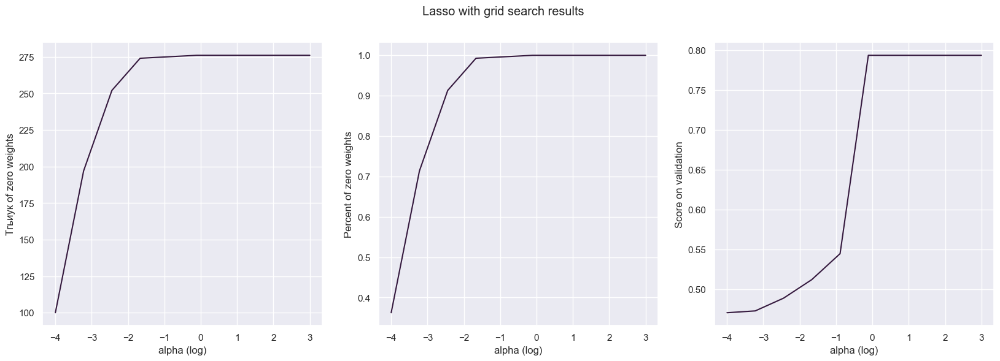

In [247]:
fig, ax = plt.subplots(1, 3, figsize=(20, 6))

plt.suptitle("Lasso with grid search results")

sns.lineplot(x=np.log10(alpha_range), y=zero_weights_cnt, ax=ax[0])
ax[0].set_xlabel("alpha (log)")
ax[0].set_ylabel('Тгьиук of zero weights')

sns.lineplot(x=np.log10(alpha_range), y=(np.array(zero_weights_cnt) / 276.0), ax=ax[1])
ax[1].set_xlabel("alpha (log)")
ax[1].set_ylabel('Percent of zero weights')

sns.lineplot(x=np.log10(alpha_range), y=score, ax=ax[2])
ax[2].set_xlabel("alpha (log)")
ax[2].set_ylabel('Score on validation')
plt.show()

In [249]:
score[3], zero_weights_cnt[3]

(0.5123310388033281, 274)

Видно, что если мы хотим хотя бы половину нулей, то жертвовать то почти и не придется - если глянуть выше на скоры валидации - мы потеряем всего 0.001. Но вот зануление 90% признаков (останется чуть больше 20, что очень легко интерпретируемо) скушает 0.028 скора.

Но! Самое удивительное - оставив всего 2 признака, можно получить скор 0,51!!!

In [254]:
pipeline_Lasso_2 = Pipeline(steps=[
    ('ohe_and_scaling', column_transformer),
    ('regression', Lasso(alpha=alpha_range[3]))
])

model_lasso_2, y_lasso_2 = apply_pipeline(X_train, y_train, X_test_2, y_test_2, pipeline_Lasso_2, name="Lasso with 2 non-zero weights")

Lasso with 2 non-zero weights score:
Train RMSLE = 0.4331
Test RMSLE = 0.5128



In [272]:
non_zero_features_mask = (model_lasso_2[-1].coef_ != 0)
X_transformed = column_transformer.fit_transform(X_train)
column_transformer.get_feature_names_out()[non_zero_features_mask], model_lasso_2[-1].coef_[non_zero_features_mask]

(array(['scaling__log_haversine', 'other_pass__high_traffic'], dtype=object),
 array([0.55887816, 0.18161238]))

О! Ожидаемо, что самый важный параметр - логарифм расстояния, а вот с траффиком - очень интересно, хотя это тоже не вызывает удивления

Собственно, это отлично показывает, что можно пожертвовать качеством в пользу простоты и интерпретируемости модели

<img src="https://www.dropbox.com/s/wp4jj0599np17lh/map_direction.png?raw=1" width="20%" align="right" style="margin-left: 20px">

**Задание 15 (1 балл)**. Часто бывает полезным использовать взаимодействия признаков (feature interactions), то есть строить новые признаки на основе уже существующих. Выше мы разбили карту Манхэттена на ячейки и придумали признаки "из какой ячейки началась поездка" и "в какой ячейке закончилась поездка".

Давайте попробуем сделать следующее: посчитаем, сколько раз встречается каждая возможная пара этих признаков в нашем датасете и выберем 100 самых частых пар. Закодируем поездки с этими частыми парами как категориальный признак, остальным объектам припишем -1. Получается, что мы закодировали, откуда и куда должно было ехать такси.

Также можете придумать ещё какой-нибудь способ сделать признаки про маршрут. Если эти признаки будут давать хороший прирост в качестве, то за это могут быть даны дополнительные бонусные баллы.

**Вопрос**: Почему такой признак потенциально полезный? Почему линейная модель не может самостоятельно "вытащить" эту информацию, ведь у нее в распоряжении есть признаки "из какой ячейки началась поездка" и "в какой ячейке закончилась поездка"?

Это признак целиком показывает: откуда и куда была поездка, то есть все заказы в одной группе имеют очень похожий маршрут. Модель может вытащить информацию о каждом признаке независимо, но она не умеет искать взаимосвязи между признаками - на то она и линейная. Без пар модель дает каждой точки отправления и каждой точки прибытия какой-то + или - в итоговый ответ, вне зависимости от второй точки.

In [109]:
route_frequency = X_train.groupby(["pickup_zone", "dropoff_zone"])[["haversine"]].agg({"haversine" : "count"}).rename(columns={"haversine" : "count"}).reset_index()
route_frequency["route"] = (route_frequency["pickup_zone"].astype("str") + "_" + route_frequency["dropoff_zone"].astype("str"))
route_frequency = route_frequency.sort_values(by=["count"], ascending=False)[["count", "route"]]
most_frequent_routes = route_frequency.head(100)["route"]

In [111]:
def add_route_feature(X, frequent_routes):
    X["route"] = X["pickup_zone"].astype("str") + "_" + X["dropoff_zone"].astype("str")
    X.loc[~X["route"].isin(frequent_routes), ["route"]] = "other"

add_route_feature(X_train, most_frequent_routes)
add_route_feature(X_test, most_frequent_routes)
add_route_feature(df, most_frequent_routes)

In [113]:
X_train["route"].value_counts()

route
other    459898
-1_-1     42162
17_-1     11962
17_17      9684
17_22      9345
          ...  
9_13       3013
17_40      2967
22_14      2924
21_31      2918
17_13      2913
Name: count, Length: 101, dtype: int64

Заново обучите модель (`Ridge`, если она дала более высокое качество в предыдущих экспериментах, и `Lasso` иначе) на новых даннных и посчитайте качество на тестовой выборке

In [117]:
categorical_f = ["hour", "week_day", "day_of_year", "month", "pickup_zone", "dropoff_zone", "route"]
numeric_f = ["log_haversine"]
other_f = ["is_anomaly_jan", "is_anomaly_may", "high_traffic", "low_traffic", "pickup_airport_lg", "pickup_airport_jk", "dropoff_airport_lg", "dropoff_airport_jk"]

# Для Ridge у нас была отдельная функция

model, y_pred = fit_predict_cat_num(X_train, y_train, X_test, y_test, categorical_f, numeric_f, other_f)

Train RMSLE = 0.3785
Test RMSLE = 0.4631


О, мы преодолели 0,47 - победа!

In [122]:
add_route_feature(X_train_2, most_frequent_routes)
add_route_feature(X_test_2, most_frequent_routes)

In [123]:
categorical_f = ["hour", "week_day", "day_of_year", "month", "pickup_zone", "dropoff_zone", "route"]
numeric_f = ["log_haversine"]
other_f = ["is_anomaly_jan", "is_anomaly_may", "high_traffic", "low_traffic", "pickup_airport_lg", "pickup_airport_jk", "dropoff_airport_lg", "dropoff_airport_jk"]

column_transformer = ColumnTransformer([
    ('ohe', OneHotEncoder(handle_unknown="ignore"), categorical_f),
    ('scaling', StandardScaler(), numeric_f),
    ("other_pass", "passthrough", other_f)
])

column_transformer.fit(X_train)

grid_search_Ridge = GridSearchCV(Ridge(), param_grid={"alpha": alpha_range}, scoring='neg_root_mean_squared_error', cv=pds, verbose=3)
    
pipeline_Ridge_gs = Pipeline(steps=[
    ('ohe_and_scaling', column_transformer),
    ('regression', grid_search_Ridge)
])

model_ridge_gs, y_ridge_gs = apply_pipeline(X_train_2, y_train_2, X_test_2, y_test_2, pipeline_Ridge_gs_2, name="Ridge with GridSearch")

Fitting 1 folds for each of 10 candidates, totalling 10 fits
[CV 1/1] END .....................alpha=0.0001;, score=-0.463 total time=   1.5s
[CV 1/1] END ......alpha=0.0005994842503189409;, score=-0.463 total time=   1.4s
[CV 1/1] END .......alpha=0.003593813663804626;, score=-0.463 total time=   1.4s
[CV 1/1] END .......alpha=0.021544346900318846;, score=-0.463 total time=   1.4s
[CV 1/1] END .........alpha=0.1291549665014884;, score=-0.463 total time=   1.4s
[CV 1/1] END ..........alpha=0.774263682681127;, score=-0.463 total time=   1.5s
[CV 1/1] END ..........alpha=4.641588833612782;, score=-0.463 total time=   1.4s
[CV 1/1] END .........alpha=27.825594022071257;, score=-0.463 total time=   1.5s
[CV 1/1] END .........alpha=166.81005372000593;, score=-0.463 total time=   1.3s
[CV 1/1] END .....................alpha=1000.0;, score=-0.464 total time=   1.2s
Ridge with GridSearch score:
Train RMSLE = 0.3949
Test RMSLE = 0.4632



:(

**Задание 16 (бонус, 1 балл)**. Где, как не для нашей задачи, считать манхэттенское расстояние?

**Вопрос**: Найдите, что такое манхэттенское расстояние и почему оно так называется. Как оно нам может помочь?

Введите систему координат на нашей карте так, чтобы оси были параллельны улицам Манхэттена, и добавьте сначала в данные признак "манхэттенское расстояние между пунктом отправления и пунктом назначения", а затем и логарифм этого признака. Посчитайте корреляцию между вашим новыми признаком и таргетом; между `log_haversine` и таргетом. В каком случае корреляция больше?

Нарисуйте карту, где покажете выбранные оси. Чтобы мы могли проверить вашу работу, просьба сделать скрин этой карты и приложить картинку (если мы откроем ваш ноутбук, виджеты отображаться не будут). 

In [ ]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ

Заново обучите модель на новых даннных и посчитайте качество на тестовой выборке. Стало ли лучше? Объясните полученный результат.

In [ ]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ

**Задание 17 (бонус, 2 балла)**. Реализуйте трансформер, который строит разбиение карты по шестигранной решётке с помощью библиотеки [H3](https://github.com/uber/h3-py) и вычисляет признаки на основе такого разбиения.

Признаки могут быть самые разные: расстояние между точкой старта и финиша, посчитанное в количестве шестиугольников; статистика по числу поездок и по их продолжительности в соседних шестиугольниках.

Важно: производительность библиотеки существенно зависит от количества шестиугольников на карте (определяется параметром resolution). Подберите такое разрешение, при котором ваш код будет работать за приемлемое время.

При построении признаков старайтесь не допустить утечки целевой переменной (подробнее про это можно почитать в материалах 1-го семинара) — в противном случае хорошего качества на тестовой выборке достичь не получится.

Измерьте качество после добавления новых признаков. За улучшение функционала ошибки на каждые 0.005 на тестовой выборке будет даваться 0.5 бонусных балла. Можно получить до 2 бонусных баллов за это задание.

In [ ]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ

Вставьте картинку, описывающую ваш опыт выполнения этого ДЗ.

![](https://animals.pibig.info/uploads/posts/2023-04/1681369283_animals-pibig-info-p-bodrii-kot-zhivotnie-vkontakte-54.jpg)